In [3]:
import pynbody
import pylab
import matplotlib.pyplot as plt
import numpy as np
from pynbody import units
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
from scipy import stats
from scipy import constants
import pynbody.filt as f
import matplotlib.gridspec as gd
import pickle
from matplotlib import colorbar
from scipy.signal import find_peaks
from scipy.signal import peak_widths
from scipy.signal import argrelextrema

In [4]:
pynbody.config["number_of_threads"] = 2
pynbody.config["sph"]["Kernel"] = 'WendlandC2'
pynbody.config['sph']['smooth-particles'] = 50

In [5]:
s = pynbody.load('../Documents/Bachelorthesis/simulations/output_279/2.79e12.02000')
h = s.halos()
h1 = h[1]
s.physical_units()

pynbody.analysis.angmom.faceon(h1)

In [6]:
s2 = pynbody.load('../Documents/Bachelorthesis/simulations/g2.79e12/g2.79e12.01024')
h2 = s2.halos()
h1_2 = h2[1]
s2.physical_units()
pynbody.analysis.angmom.faceon(h1_2)

In [7]:
disk = f.LowPass('r', '72 kpc') & f.BandPass('z', '-2.5 kpc', '2.5 kpc')
tem = f.LowPass('temp', '30000 K')
g = h1[disk]
g2 = h1_2[disk]
gal = g.g[tem]
gal2 = g2.g[tem]

In [8]:
print(gal['smooth'].min())
print(gal['smooth'].max())
print(np.median(gal['smooth']))

print(gal2['smooth'].min())
print(gal2['smooth'].max())
print(np.median(gal2['smooth']))

0.025030463933944702
3.361041784286499
0.1721547320485115
0.04731494188308716
4.532496929168701
0.24190333485603333


: 

In [7]:
print(np.median(gal['smooth']))
print(np.max(gal['smooth']))
print(np.min(gal['smooth']))
print(np.median(gal2['smooth']))
print(np.max(gal2['smooth']))
print(np.min(gal2['smooth']))

0.1721547320485115
3.361041784286499
0.025030463933944702
0.24190333485603333
4.532496929168701
0.04731494188308716


In [6]:
@pynbody.snapshot.SimSnap.stable_derived_quantity
def rho_W(self):
    import numpy as np
    pynbody.sph.build_tree_or_trees(self)


    rho = pynbody.array.SimArray(
        np.empty(len(self['pos'])), self['mass'].units / self['pos'].units ** 3,
        dtype=self['pos'].dtype)



    self.kdtree.set_array_ref('smooth',pynbody.sph._get_smooth_array_ensuring_compatibility(self))
    self.kdtree.set_array_ref('mass',self['mass'])
    self.kdtree.set_array_ref('rho',rho)

    self.kdtree.populate('rho', pynbody.config['sph']['smooth-particles'], 'WendlandC2')

    return rho


@pynbody.snapshot.SimSnap.stable_derived_quantity
def rho_CS(self):
    import numpy as np
    pynbody.sph.build_tree_or_trees(self)


    rho = pynbody.array.SimArray(
        np.empty(len(self['pos'])), self['mass'].units / self['pos'].units ** 3,
        dtype=self['pos'].dtype)



    self.kdtree.set_array_ref('smooth',pynbody.sph._get_smooth_array_ensuring_compatibility(self))
    self.kdtree.set_array_ref('mass',self['mass'])
    self.kdtree.set_array_ref('rho',rho)

    self.kdtree.populate('rho', pynbody.config['sph']['smooth-particles'], 'CubicSpline')

    return rho

In [7]:
@pynbody.snapshot.SimSnap.stable_derived_quantity
def mass_sph(self):
    import logging
    logger = logging.getLogger('pynbody.sph')

    pynbody.sph.build_tree_or_trees(self)

    logger.info('Calculating sph mean')
    
    mass_sph = self.kdtree.sph_mean(self['mass'], nsmooth=pynbody.config['sph']['smooth-particles'])
    

    return mass_sph

@pynbody.snapshot.SimSnap.derived_quantity
def v_curl2(self):
    """Squared velocity"""
    return (self['v_curl'] ** 2).sum(axis=1)

# mass weighted 2d histograms

def mw_hist2(fam, key, b):
    hist, xbin, ybin = np.histogram2d(fam['x'],fam['y'],weights=fam[key]*fam['mass'], bins=b, range=((-50,50),(-50,50)))
    mass, xbin, ybin = np.histogram2d(fam['x'],fam['y'],weights=fam['mass'], bins=b, range=((-50,50),(-50,50)))
    return hist/mass

def mw_hist(fam, array, b):
    hist, xbin, ybin = np.histogram2d(fam['x'],fam['y'],weights=array*fam['mass'], bins=b, range=((-50,50),(-50,50)))
    mass, xbin, ybin = np.histogram2d(fam['x'],fam['y'],weights=fam['mass'], bins=b, range=((-50,50),(-50,50)))
    return hist/mass

In [8]:
gal['alpha_4'] = 1/4*(np.abs(gal['v_div'].in_units('s**-1'))**2+np.sqrt(gal['v_curl2'].in_units('s**-2'))**2)/(constants.G*units.m**3*units.kg**-1*gal['rho'].in_units('kg m**-3')).in_units(1)
gal2['alpha_4'] = 1/4*(np.abs(gal2['v_div'].in_units('s**-1'))**2+np.sqrt(gal2['v_curl2'].in_units('s**-2'))**2)/(constants.G*units.m**3*units.kg**-1*gal2['rho'].in_units('kg m**-3')).in_units(1)


In [9]:
(10*1.673*10**(-27)*units.kg/units.cm**3).ratio(units.Msol/units.kpc**3)
sf = f.HighPass('rho_W', '0.247 Msol pc^-3') & f.LowPass('temp', '30000 K')
gal_sf = gal[sf]
gal2_sf = gal2[sf]
Hop = f.LowPass('alpha_4', '1')
gal_Hop = gal[Hop]
gal2_Hop = gal2[Hop]

In [16]:
'''''''''''''''''
m_part = gal.g['mass']
m_part2 = gal2.g['mass']
gal.g['radius'] = gal.g['smooth'].in_units('m') #in units m
gal.g['radius_3'] = gal.g['radius']
gal.g['radius_3'] = (m_part.in_units('kg')/gal.g['rho']*((3.0857e+19)**3/(2e+30))*3/(4*np.pi))**(1/3)
gal2.g['radius'] = gal2.g['smooth'].in_units('m') #in units m
gal2.g['radius_3'] = gal2.g['radius']
gal2.g['radius_3'] = (m_part2.in_units('kg')/gal2.g['rho']*((3.0857e+19)**3/(2e+30))*3/(4*np.pi))**(1/3)
gal.g['alpha_3'] = (5*(gal.g['v_disp'].in_units('m s**-1'))**2*gal.g['radius_3']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_part.in_units('kg'))).in_units(1)
gal2.g['alpha_3'] = (5*(gal2.g['v_disp'].in_units('m s**-1'))**2*gal2.g['radius_3']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_part2.in_units('kg'))).in_units(1)
''''''''''''''''

: 

: 

In [10]:
low_div = f.LowPass('v_div', '0 km kpc**-1 s**-1')
gal_low_div = gal[low_div]
gal2_low_div = gal2[low_div]

In [13]:
'''''''''
m_part = gal.g['mass']
gal.g['radius'] = gal.g['smooth'].in_units('m') #in units m
gal.g['radius_3'] = gal.g['radius']
gal.g['radius_3'] = (m_part.in_units('kg')/gal.g['rho']*((3.0857e+19)**3/(2e+30))*3/(4*np.pi))**(1/3)
gal.g['alpha_sem'] = 1.35*(np.sqrt(3*np.pi/(32*constants.G*units.m**3*units.kg**-1*units.s**-2*gal.g['rho'])).in_units('s')*2*np.sqrt(gal.g['v_disp']**2/3+gal.g['cs']**2)/(2*gal.g['smooth']).in_units('km'))**2
low_alpha = f.LowPass('alpha_sem', '100')
gal.g['alpha_3'] = (5*(gal.g['v_disp'].in_units('m s**-1'))**2*gal.g['radius_3']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_part.in_units('kg'))).in_units(1)
gal.g['alpha_4'] = 1/4*(np.abs(gal.g['v_div'].in_units('s**-1'))**2+np.sqrt(gal.g['v_curl2'].in_units('s**-2'))**2)/(constants.G*units.m**3*units.kg**-1*gal.g['rho'].in_units('kg m**-3')).in_units(1)

gal.g['efficiency_sem'] = np.exp(-2.02*gal.g['alpha_sem']**(1/2))
gal.g['eff_Pad'] = np.exp(-1.6*gal.g['alpha_sem']**(1/2))
gal.g['efficiency_vdisp'] = np.exp(-2.02*gal.g['alpha_3']**(1/2))
gal.g['efficiency_Hopkins'] = np.exp(-2.02*gal.g['alpha_4']**(1/2))
'''''''''

"\nm_part = gal.g['mass']\ngal.g['radius'] = gal.g['smooth'].in_units('m') #in units m\ngal.g['radius_3'] = gal.g['radius']\ngal.g['radius_3'] = (m_part.in_units('kg')/gal.g['rho']*((3.0857e+19)**3/(2e+30))*3/(4*np.pi))**(1/3)\ngal.g['alpha_sem'] = 1.35*(np.sqrt(3*np.pi/(32*constants.G*units.m**3*units.kg**-1*units.s**-2*gal.g['rho'])).in_units('s')*2*np.sqrt(gal.g['v_disp']**2/3+gal.g['cs']**2)/(2*gal.g['smooth']).in_units('km'))**2\nlow_alpha = f.LowPass('alpha_sem', '100')\ngal.g['alpha_3'] = (5*(gal.g['v_disp'].in_units('m s**-1'))**2*gal.g['radius_3']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_part.in_units('kg'))).in_units(1)\ngal.g['alpha_4'] = 1/4*(np.abs(gal.g['v_div'].in_units('s**-1'))**2+np.sqrt(gal.g['v_curl2'].in_units('s**-2'))**2)/(constants.G*units.m**3*units.kg**-1*gal.g['rho'].in_units('kg m**-3')).in_units(1)\n\ngal.g['efficiency_sem'] = np.exp(-2.02*gal.g['alpha_sem']**(1/2))\ngal.g['eff_Pad'] = np.exp(-1.6*gal.g['alpha_sem']**(1/2))\ngal.g['efficiency_vd

In [ ]:
'''''''''''''''
m_part = gal2.g['mass']
gal2.g['radius'] = gal2.g['smooth'].in_units('m') #in units m
gal2.g['radius_3'] = gal2.g['radius']
gal2.g['radius_3'] = (m_part.in_units('kg')/gal2.g['rho']*((3.0857e+19)**3/(2e+30))*3/(4*np.pi))**(1/3)
gal2.g['alpha_sem'] = 1.35*(np.sqrt(3*np.pi/(32*constants.G*units.m**3*units.kg**-1*units.s**-2*gal2.g['rho'])).in_units('s')*2*np.sqrt(gal2.g['v_disp']**2/3+gal2.g['cs']**2)/(2*gal2.g['smooth']).in_units('km'))**2
low_alpha = f.LowPass('alpha_sem', '100')
gal2.g['alpha_3'] = (5*(gal2.g['v_disp'].in_units('m s**-1'))**2*gal2.g['radius_3']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_part.in_units('kg'))).in_units(1)
gal2.g['alpha_4'] = 1/4*(np.abs(gal2.g['v_div'].in_units('s**-1'))**2+np.sqrt(gal2.g['v_curl2'].in_units('s**-2'))**2)/(constants.G*units.m**3*units.kg**-1*gal2.g['rho'].in_units('kg m**-3')).in_units(1)

gal2.g['efficiency_sem'] = np.exp(-2.02*gal2.g['alpha_sem']**(1/2))
gal2.g['efficiency_vdisp'] = np.exp(-2.02*gal2.g['alpha_3']**(1/2))
gal2.g['efficiency_Hopkins'] = np.exp(-2.02*gal2.g['alpha_4']**(1/2))
'''''''''

In [ ]:
'''''''''
gal2.g['alpha_sem'] = 1.35*(np.sqrt(3*np.pi/(32*constants.G*units.m**3*units.kg**-1*units.s**-2*gal2.g['rho'])).in_units('s')*2*np.sqrt(gal2.g['v_disp']**2/3+gal2.g['cs']**2)/(2*gal2.g['smooth']).in_units('km'))**2
low_alpha = f.LowPass('alpha_sem', '100')
'''''''''

In [11]:

#calculations
#gal['rho'] = gal['rho_CS']
gal['rho'] = gal['rho_W']
gal['v_div']
gal['v_curl']
gal['mass_sph']
gal['v_curl2']
m_part = gal['mass']
m_kern = gal['rho']*4/3*np.pi*(2*gal['smooth'])**3/50
m_sph = gal['mass_sph']

gal['radius'] = 2*gal['smooth'].in_units('m') #in units m
gal['radius_2'] = gal['radius']
gal['radius_2'] = (m_sph.in_units('kg')/gal['rho']*((3.0857e+19)**3/(2e+30))*3/(4*np.pi))**(1/3)
gal['radius_3'] = gal['radius']
gal['radius_3'] = (m_part.in_units('kg')/gal['rho']*((3.0857e+19)**3/(2e+30))*3/(4*np.pi))**(1/3)

gal['alpha'] = (5*(gal['v_disp'].in_units('m s**-1'))**2*gal['radius']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_kern.in_units('kg'))).in_units(1)
gal['alpha_2'] = (5*(gal['v_disp'].in_units('m s**-1'))**2*gal['radius_2']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_sph.in_units('kg'))).in_units(1)
gal['alpha_3'] = (5*(gal['v_disp'].in_units('m s**-1'))**2*gal['radius_3']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_part.in_units('kg'))).in_units(1)
gal['alpha_4'] = 1/4*(np.abs(gal['v_div'].in_units('s**-1'))**2+np.sqrt(gal['v_curl2'].in_units('s**-2'))**2)/(constants.G*units.m**3*units.kg**-1*gal['rho'].in_units('kg m**-3')).in_units(1)
gal['alpha_sem'] = 1.35*(np.sqrt(3*np.pi/(32*constants.G*units.m**3*units.kg**-1*units.s**-2*gal['rho'])).in_units('s')*2*np.sqrt(gal['v_disp']**2/3+gal['cs']**2)/(2*gal['smooth']).in_units('km'))**2

gal['eff_evans_0_3'] = 0.3*np.exp(-2.02*gal['alpha_3']**(1/2))
gal['eff_evans_1'] = np.exp(-2.02*gal['alpha_3']**(1/2))
gal['eff_sem'] = 0.9*np.exp(-1.6*gal['alpha_sem']**(1/2))
gal['eff_pad'] = 0.5*np.exp(-1.6*gal['alpha_sem']**(1/2))

low_alpha = f.LowPass('alpha', '100')
low_alpha_2 = f.LowPass('alpha_2', '100')
low_alpha_3 = f.LowPass('alpha_3', '100')
low_alpha_4 = f.LowPass('alpha_4', '10')
low_alpha_sem = f.LowPass('alpha_sem', '100')
low_div = f.LowPass('v_div', '0 km kpc**-1 s**-1')

gal_low_alpha_4 = gal[low_alpha_4]
gal_low_alpha_sem = gal[low_alpha_sem]
gal_low_div = gal[low_div]



/tmp/ipykernel_1762/696486115.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


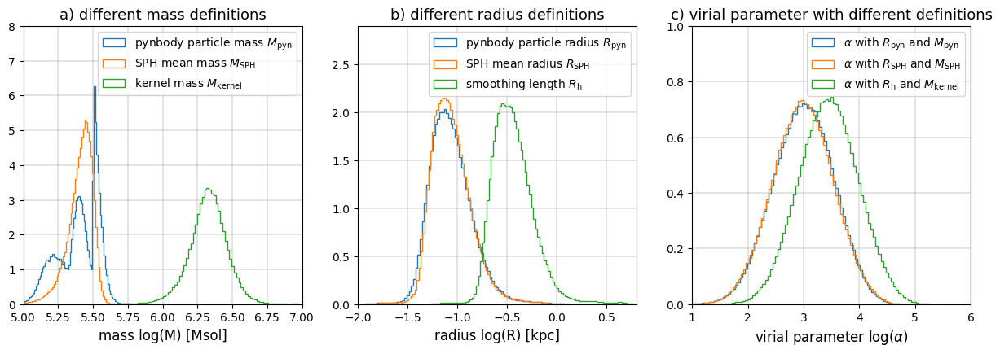

In [19]:
mass_list = [m_part, m_sph, m_kern]
radius_list = [gal['radius_3'].in_units('kpc'), gal['radius_2'].in_units('kpc'), gal['radius'].in_units('kpc')]
alpha_list = [gal['alpha_3'], gal['alpha_2'], gal['alpha']]
key_list = [np.log10(mass_list), np.log10(radius_list), np.log10(alpha_list)]
range_list = [(5, 7), (-2, 0.8), (1, 6)]
y_list = [(0, 8), (0, 2.9),(0, 1)]
#colorlist = ['skyblue', 'firebrick', 'lightseagreen']
title = ['a) different mass definitions', 'b) different radius definitions', 'c) virial parameter with different definitions']
label_mass = [r'pynbody particle mass $M_{\mathrm{pyn}}$', r'SPH mean mass $M_{\mathrm{SPH}}$', r'kernel mass $M_{\mathrm{kernel}}$']
label_radius = [r'pynbody particle radius $R_{\mathrm{pyn}}$', r'SPH mean radius $R_{\mathrm{SPH}}$', r'smoothing length $R_{\mathrm{h}}$']
label_alpha = [r'$\alpha$ with $R_{\mathrm{pyn}}$ and $M_{\mathrm{pyn}}$', r'$\alpha$ with $R_{\mathrm{SPH}}$ and $M_{\mathrm{SPH}}$', r'$\alpha$ with $R_{\mathrm{h}}$ and $M_{\mathrm{kernel}}$']
label_list = [label_mass, label_radius, label_alpha]
loc = ['upper right', 'upper right', 'upper right']
unit = ['mass log(M) [Msol]', 'radius log(R) [kpc]', 'virial parameter log('+ r'$\alpha$'+')']
fig = plt.figure(figsize = (15,5))
gs0 = gd.GridSpec(1, 3, figure=fig, wspace = 0.2)

for n in range(3):
    ax = fig.add_subplot(gs0[n])
    for i in range(3):
        hist, bins, edges = ax.hist(key_list[n][i], bins = 100, label = label_list[n][i], histtype = 'step', density = True)
    ax.legend(fontsize = 10, loc = loc[n])
    ax.set_title(title[n], wrap = True, fontsize = 13)
    ax.set_xlabel(unit[n], fontsize = 12)
    ax.set_xlim(range_list[n])
    ax.set_ylim(y_list[n])
    ax.set_aspect(1./ax.get_data_ratio())
    ax.grid(linewidth = 0.3, color = 'grey')
fig.tight_layout() 
fig.savefig('../Documents/Bachelorthesis/mass_radius_alpha_comparison_cold.png')

In [13]:

#calculations for low-resolution simulation
#gal2['rho'] = gal2['rho_CS']
gal2['rho'] = gal2['rho_W']
gal2['v_div']
gal2['v_curl']
gal2['mass_sph']
gal2['v_curl2']
m_part = gal2['mass']
m_kern = gal2['rho']*4/3*np.pi*gal2['smooth']**3 
m_sph = gal2['mass_sph']

gal2['radius'] = gal2['smooth'].in_units('m') #in units m
gal2['radius_2'] = gal2['radius']
gal2['radius_2'] = (m_sph.in_units('kg')/gal2['rho']*((3.0857e+19)**3/(2e+30))*3/(4*np.pi))**(1/3)
gal2['radius_3'] = gal2['radius']
gal2['radius_3'] = (m_part.in_units('kg')/gal2['rho']*((3.0857e+19)**3/(2e+30))*3/(4*np.pi))**(1/3)

gal2['alpha'] = (5*(gal2['v_disp'].in_units('m s**-1'))**2*gal2['radius']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_sph.in_units('kg'))).in_units(1)
gal2['alpha_2'] = (5*(gal2['v_disp'].in_units('m s**-1'))**2*gal2['radius_2']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_sph.in_units('kg'))).in_units(1)
gal2['alpha_3'] = (5*(gal2['v_disp'].in_units('m s**-1'))**2*gal2['radius_3']/(3*constants.G*units.m**3*units.kg**-1*units.s**-2*m_part.in_units('kg'))).in_units(1)
gal2['alpha_4'] = 1/4*(np.abs(gal2['v_div'].in_units('s**-1'))**2+np.sqrt(gal2['v_curl2'].in_units('s**-2'))**2)/(constants.G*units.m**3*units.kg**-1*gal2['rho'].in_units('kg m**-3')).in_units(1)
gal2['alpha_sem'] = 1.35*(np.sqrt(3*np.pi/(32*constants.G*units.m**3*units.kg**-1*units.s**-2*gal2['rho'])).in_units('s')*2*np.sqrt(gal2['v_disp']**2/3+gal2['cs']**2)/(2*gal2['smooth']).in_units('km'))**2

gal2['eff_evans_0_3'] = 0.3*np.exp(-2.02*gal2['alpha_3']**(1/2))
gal2['eff_evans_1'] = np.exp(-2.02*gal2['alpha_3']**(1/2))
gal2['eff_sem'] = 0.9*np.exp(-1.6*gal2['alpha_sem']**(1/2))
gal2['eff_pad'] = 0.5*np.exp(-1.6*gal2['alpha_sem']**(1/2))

low_alpha = f.LowPass('alpha', '100')
low_alpha_2 = f.LowPass('alpha_2', '100')
low_alpha_3 = f.LowPass('alpha_3', '100')
low_alpha_4 = f.LowPass('alpha_4', '10')
low_alpha_sem = f.LowPass('alpha_sem', '100')
low_div = f.LowPass('v_div', '0 km kpc**-1 s**-1')

gal2_low_alpha_4 = gal2[low_alpha_4]  # nur Regionen mit alpha nach Hopkins unter 10
gal2_low_alpha_sem = gal2[low_alpha_sem] # nur Regionen mit alpha nach semenov unter 100
gal2_low_div = gal2[low_div] # nur Regionen in denen divergenz der velocity über 0 ist (Hopkins low converging criteria)


In [35]:
with open('W_50.pkl', 'wb') as W_50_pickle:
    pickle.dump(gal['rho'], W_50_pickle)
    pickle.dump(gal['rho_W'], W_50_pickle)
    pickle.dump(gal['v_div'], W_50_pickle)
    pickle.dump(gal['v_curl'], W_50_pickle)
    pickle.dump(gal['mass_sph'], W_50_pickle)
    pickle.dump(gal['v_curl2'], W_50_pickle)
    pickle.dump(gal['v_disp'], W_50_pickle)
    pickle.dump(gal['mass'], W_50_pickle)
    pickle.dump(gal['smooth'], W_50_pickle)
    pickle.dump(gal['radius'], W_50_pickle)
    pickle.dump(gal['radius_2'], W_50_pickle)
    pickle.dump(gal['radius_3'], W_50_pickle)
    pickle.dump(gal['alpha'], W_50_pickle)
    pickle.dump(gal['alpha_2'], W_50_pickle)
    pickle.dump(gal['alpha_3'], W_50_pickle)
    pickle.dump(gal['alpha_4'], W_50_pickle)
    pickle.dump(gal['alpha_sem'], W_50_pickle)
    pickle.dump(gal_low_alpha_sem['alpha_sem'], W_50_pickle)
    pickle.dump(gal['eff_evans_0_3'], W_50_pickle)
    pickle.dump(gal['eff_evans_1'], W_50_pickle)
    pickle.dump(gal['eff_sem'], W_50_pickle)
    pickle.dump(gal['eff_pad'], W_50_pickle)
    pickle.dump(gal['rho_W'], W_50_pickle)
    pickle.dump(gal_low_div['alpha_4'], W_50_pickle)
    pickle.dump(gal_Hop['x'], W_50_pickle)
    pickle.dump(gal_Hop['y'], W_50_pickle)
    pickle.dump(gal_sf['x'], W_50_pickle)
    pickle.dump(gal_sf['y'], W_50_pickle)
    pickle.dump(gal2['rho_W'], W_50_pickle)
    pickle.dump(gal2['v_div'], W_50_pickle)
    pickle.dump(gal2['v_curl'], W_50_pickle)
    pickle.dump(gal2['mass_sph'], W_50_pickle)
    pickle.dump(gal2['v_curl2'], W_50_pickle)
    pickle.dump(gal2['v_disp'], W_50_pickle)
    pickle.dump(gal2['mass'], W_50_pickle)
    pickle.dump(gal2['smooth'], W_50_pickle)
    pickle.dump(gal2['radius'], W_50_pickle)
    pickle.dump(gal2['radius_2'], W_50_pickle)
    pickle.dump(gal2['radius_3'], W_50_pickle)
    pickle.dump(gal2['alpha'], W_50_pickle)
    pickle.dump(gal2['alpha_2'], W_50_pickle)
    pickle.dump(gal2['alpha_3'], W_50_pickle)
    pickle.dump(gal2['alpha_4'], W_50_pickle)
    pickle.dump(gal2['alpha_sem'], W_50_pickle)
    pickle.dump(gal2_low_alpha_sem['alpha_sem'], W_50_pickle)
    pickle.dump(gal2['eff_evans_0_3'], W_50_pickle)
    pickle.dump(gal2['eff_evans_1'], W_50_pickle)
    pickle.dump(gal2['eff_sem'], W_50_pickle)
    pickle.dump(gal2['eff_pad'], W_50_pickle)
    pickle.dump(gal2['rho_W'], W_50_pickle)
    pickle.dump(gal2_low_div['alpha_4'], W_50_pickle)
    pickle.dump(gal2_Hop['x'], W_50_pickle)
    pickle.dump(gal2_Hop['y'], W_50_pickle)
    pickle.dump(gal2_sf['x'], W_50_pickle)
    pickle.dump(gal2_sf['y'], W_50_pickle)
    

In [15]:
# unpickling CS_25
with open('CS_25.pkl', 'rb') as CS_25_pickle:
    rho_CS_25 = pickle.load(CS_25_pickle)
    rhof_CS_25 = pickle.load(CS_25_pickle)
    vdiv_CS_25 = pickle.load(CS_25_pickle)
    vcurl_CS_25 = pickle.load(CS_25_pickle)
    sphmass_CS_25 = pickle.load(CS_25_pickle)
    vcurl2_CS_25 = pickle.load(CS_25_pickle)
    vdisp_CS_25 = pickle.load(CS_25_pickle)
    mass_CS_25 = pickle.load(CS_25_pickle)
    smooth_CS_25 = pickle.load(CS_25_pickle) 
    radius_CS_25 = pickle.load(CS_25_pickle)
    radius2_CS_25 = pickle.load(CS_25_pickle)
    radius3_CS_25 = pickle.load(CS_25_pickle)   
    alpha_vir_sph_CS_25 = pickle.load(CS_25_pickle)
    alpha_vir_sph2_CS_25 = pickle.load(CS_25_pickle)
    alpha_vir_CS_25 = pickle.load(CS_25_pickle)
    alpha_Hop_CS_25 = pickle.load(CS_25_pickle)
    alpha_Pad_CS_25 = pickle.load(CS_25_pickle)
    alpha_Pad_low_CS_25 = pickle.load(CS_25_pickle)
    eff_vir_CS_25 = pickle.load(CS_25_pickle)
    eff_Hop_CS_25 = pickle.load(CS_25_pickle)
    eff_Pad_CS_25 = pickle.load(CS_25_pickle)
    eff_Pad_low_CS_25 = pickle.load(CS_25_pickle)
    rho_W_CS_25 = pickle.load(CS_25_pickle)
    alpha_Hop_conv_CS_25 = pickle.load(CS_25_pickle)
    x_Hop_CS_25 = pickle.load(CS_25_pickle)
    y_Hop_CS_25 = pickle.load(CS_25_pickle)  
    x_sf_CS_25 = pickle.load(CS_25_pickle)
    y_sf_CS_25 = pickle.load(CS_25_pickle)
    rho_CS_25_2 = pickle.load(CS_25_pickle)
    vdiv_CS_25_2 = pickle.load(CS_25_pickle)
    vcurl_CS_25_2 = pickle.load(CS_25_pickle)
    sphmass_CS_25_2 = pickle.load(CS_25_pickle)
    vcurl2_CS_25_2 = pickle.load(CS_25_pickle)
    vdisp_CS_25_2 = pickle.load(CS_25_pickle)
    mass_CS_25_2 = pickle.load(CS_25_pickle)
    smooth_CS_25_2 = pickle.load(CS_25_pickle) 
    radius_CS_25_2 = pickle.load(CS_25_pickle)
    radius2_CS_25_2 = pickle.load(CS_25_pickle)
    radius3_CS_25_2 = pickle.load(CS_25_pickle)   
    alpha_vir_sph_CS_25_2 = pickle.load(CS_25_pickle)
    alpha_vir_sph2_CS_25_2 = pickle.load(CS_25_pickle)
    alpha_vir_CS_25_2 = pickle.load(CS_25_pickle)
    alpha_Hop_CS_25_2 = pickle.load(CS_25_pickle)
    alpha_Pad_CS_25_2 = pickle.load(CS_25_pickle)
    alpha_Pad_low_CS_25_2 = pickle.load(CS_25_pickle)
    eff_vir_CS_25_2 = pickle.load(CS_25_pickle)
    eff_Hop_CS_25_2 = pickle.load(CS_25_pickle)
    eff_Pad_CS_25_2 = pickle.load(CS_25_pickle)
    eff_Pad_low_CS_25_2 = pickle.load(CS_25_pickle)
    rho_W_CS_25_2 = pickle.load(CS_25_pickle)
    alpha_Hop_conv_CS_25_2 = pickle.load(CS_25_pickle)
    x_Hop_CS_25_2 = pickle.load(CS_25_pickle)
    y_Hop_CS_25_2 = pickle.load(CS_25_pickle)  
    x_sf_CS_25_2 = pickle.load(CS_25_pickle)
    y_sf_CS_25_2 = pickle.load(CS_25_pickle)


In [16]:

# unpickling
with open('CS_50.pkl', 'rb') as CS_50_pickle:
    rho_CS_50 = pickle.load(CS_50_pickle)
    rhof_CS_50 = pickle.load(CS_50_pickle)
    vdiv_CS_50 = pickle.load(CS_50_pickle)
    vcurl_CS_50 = pickle.load(CS_50_pickle)
    sphmass_CS_50 = pickle.load(CS_50_pickle)
    vcurl2_CS_50 = pickle.load(CS_50_pickle)
    vdisp_CS_50 = pickle.load(CS_50_pickle)
    mass_CS_50 = pickle.load(CS_50_pickle)
    smooth_CS_50 = pickle.load(CS_50_pickle) 
    radius_CS_50 = pickle.load(CS_50_pickle)
    radius2_CS_50 = pickle.load(CS_50_pickle)
    radius3_CS_50 = pickle.load(CS_50_pickle)   
    alpha_vir_sph_CS_50 = pickle.load(CS_50_pickle)
    alpha_vir_sph2_CS_50 = pickle.load(CS_50_pickle)
    alpha_vir_CS_50 = pickle.load(CS_50_pickle)
    alpha_Hop_CS_50 = pickle.load(CS_50_pickle)
    alpha_Pad_CS_50 = pickle.load(CS_50_pickle)
    alpha_Pad_low_CS_50 = pickle.load(CS_50_pickle)
    eff_evans_0_3_CS_50 = pickle.load(CS_50_pickle)
    eff_evans_1_CS_50 = pickle.load(CS_50_pickle)
    eff_sem_CS_50 = pickle.load(CS_50_pickle)
    eff_pad_CS_50 = pickle.load(CS_50_pickle)
    rho_W_CS_50 = pickle.load(CS_50_pickle)
    alpha_Hop_conv_CS_50 = pickle.load(CS_50_pickle)
    x_Hop_CS_50 = pickle.load(CS_50_pickle)
    y_Hop_CS_50 = pickle.load(CS_50_pickle)  
    x_sf_CS_50 = pickle.load(CS_50_pickle)
    y_sf_CS_50 = pickle.load(CS_50_pickle)
    rho_CS_50_2 = pickle.load(CS_50_pickle)
    vdiv_CS_50_2 = pickle.load(CS_50_pickle)
    vcurl_CS_50_2 = pickle.load(CS_50_pickle)
    sphmass_CS_50_2 = pickle.load(CS_50_pickle)
    vcurl2_CS_50_2 = pickle.load(CS_50_pickle)
    vdisp_CS_50_2 = pickle.load(CS_50_pickle)
    mass_CS_50_2 = pickle.load(CS_50_pickle)
    smooth_CS_50_2 = pickle.load(CS_50_pickle) 
    radius_CS_50_2 = pickle.load(CS_50_pickle)
    radius2_CS_50_2 = pickle.load(CS_50_pickle)
    radius3_CS_50_2 = pickle.load(CS_50_pickle)   
    alpha_vir_sph_CS_50_2 = pickle.load(CS_50_pickle)
    alpha_vir_sph2_CS_50_2 = pickle.load(CS_50_pickle)
    alpha_vir_CS_50_2 = pickle.load(CS_50_pickle)
    alpha_Hop_CS_50_2 = pickle.load(CS_50_pickle)
    alpha_Pad_CS_50_2 = pickle.load(CS_50_pickle)
    alpha_Pad_low_CS_50_2 = pickle.load(CS_50_pickle)
    eff_evans_0_3_CS_50_2 = pickle.load(CS_50_pickle)
    eff_evans_1_CS_50_2 = pickle.load(CS_50_pickle)
    eff_sem_CS_50_2 = pickle.load(CS_50_pickle)
    eff_pad_CS_50_2 = pickle.load(CS_50_pickle)
    rho_W_CS_50_2 = pickle.load(CS_50_pickle)
    alpha_Hop_conv_CS_50_2 = pickle.load(CS_50_pickle)
    x_Hop_CS_50_2 = pickle.load(CS_50_pickle)
    y_Hop_CS_50_2 = pickle.load(CS_50_pickle)  
    x_sf_CS_50_2 = pickle.load(CS_50_pickle)
    y_sf_CS_50_2 = pickle.load(CS_50_pickle)

In [17]:

# unpickling
with open('CS_100.pkl', 'rb') as CS_100_pickle:
    rho_CS_100 = pickle.load(CS_100_pickle)
    rhof_CS_100 = pickle.load(CS_100_pickle)
    vdiv_CS_100 = pickle.load(CS_100_pickle)
    vcurl_CS_100 = pickle.load(CS_100_pickle)
    sphmass_CS_100 = pickle.load(CS_100_pickle)
    vcurl2_CS_100 = pickle.load(CS_100_pickle)
    vdisp_CS_100 = pickle.load(CS_100_pickle)
    mass_CS_100 = pickle.load(CS_100_pickle)
    smooth_CS_100 = pickle.load(CS_100_pickle) 
    radius_CS_100 = pickle.load(CS_100_pickle)
    radius2_CS_100 = pickle.load(CS_100_pickle)
    radius3_CS_100 = pickle.load(CS_100_pickle)   
    alpha_vir_sph_CS_100 = pickle.load(CS_100_pickle)
    alpha_vir_sph2_CS_100 = pickle.load(CS_100_pickle)
    alpha_vir_CS_100 = pickle.load(CS_100_pickle)
    alpha_Hop_CS_100 = pickle.load(CS_100_pickle)
    alpha_Pad_CS_100 = pickle.load(CS_100_pickle)
    alpha_Pad_low_CS_100 = pickle.load(CS_100_pickle)
    eff_vir_CS_100 = pickle.load(CS_100_pickle)
    eff_Hop_CS_100 = pickle.load(CS_100_pickle)
    eff_Pad_CS_100 = pickle.load(CS_100_pickle)
    eff_Pad_low_CS_100 = pickle.load(CS_100_pickle)
    rho_W_CS_100 = pickle.load(CS_100_pickle)
    alpha_Hop_conv_CS_100 = pickle.load(CS_100_pickle)
    x_Hop_CS_100 = pickle.load(CS_100_pickle)
    y_Hop_CS_100 = pickle.load(CS_100_pickle)  
    x_sf_CS_100 = pickle.load(CS_100_pickle)
    y_sf_CS_100 = pickle.load(CS_100_pickle)
    rho_CS_100_2 = pickle.load(CS_100_pickle)
    vdiv_CS_100_2 = pickle.load(CS_100_pickle)
    vcurl_CS_100_2 = pickle.load(CS_100_pickle)
    sphmass_CS_100_2 = pickle.load(CS_100_pickle)
    vcurl2_CS_100_2 = pickle.load(CS_100_pickle)
    vdisp_CS_100_2 = pickle.load(CS_100_pickle)
    mass_CS_100_2 = pickle.load(CS_100_pickle)
    smooth_CS_100_2 = pickle.load(CS_100_pickle) 
    radius_CS_100_2 = pickle.load(CS_100_pickle)
    radius2_CS_100_2 = pickle.load(CS_100_pickle)
    radius3_CS_100_2 = pickle.load(CS_100_pickle)   
    alpha_vir_sph_CS_100_2 = pickle.load(CS_100_pickle)
    alpha_vir_sph2_CS_100_2 = pickle.load(CS_100_pickle)
    alpha_vir_CS_100_2 = pickle.load(CS_100_pickle)
    alpha_Hop_CS_100_2 = pickle.load(CS_100_pickle)
    alpha_Pad_CS_100_2 = pickle.load(CS_100_pickle)
    alpha_Pad_low_CS_100_2 = pickle.load(CS_100_pickle)
    eff_vir_CS_100_2 = pickle.load(CS_100_pickle)
    eff_Hop_CS_100_2 = pickle.load(CS_100_pickle)
    eff_Pad_CS_100_2 = pickle.load(CS_100_pickle)
    eff_Pad_low_CS_100_2 = pickle.load(CS_100_pickle)
    rho_W_CS_100_2 = pickle.load(CS_100_pickle)
    alpha_Hop_conv_CS_100_2 = pickle.load(CS_100_pickle)
    x_Hop_CS_100_2 = pickle.load(CS_100_pickle)
    y_Hop_CS_100_2 = pickle.load(CS_100_pickle)  
    x_sf_CS_100_2 = pickle.load(CS_100_pickle)
    y_sf_CS_100_2 = pickle.load(CS_100_pickle)

In [18]:
# unpickling
with open('CS_200.pkl', 'rb') as CS_200_pickle:
    rho_CS_200 = pickle.load(CS_200_pickle)
    rhof_CS_200 = pickle.load(CS_200_pickle)
    vdiv_CS_200 = pickle.load(CS_200_pickle)
    vcurl_CS_200 = pickle.load(CS_200_pickle)
    sphmass_CS_200 = pickle.load(CS_200_pickle)
    vcurl2_CS_200 = pickle.load(CS_200_pickle)
    vdisp_CS_200 = pickle.load(CS_200_pickle)
    mass_CS_200 = pickle.load(CS_200_pickle)
    smooth_CS_200 = pickle.load(CS_200_pickle) 
    radius_CS_200 = pickle.load(CS_200_pickle)
    radius2_CS_200 = pickle.load(CS_200_pickle)
    radius3_CS_200 = pickle.load(CS_200_pickle)   
    alpha_vir_sph_CS_200 = pickle.load(CS_200_pickle)
    alpha_vir_sph2_CS_200 = pickle.load(CS_200_pickle)
    alpha_vir_CS_200 = pickle.load(CS_200_pickle)
    alpha_Hop_CS_200 = pickle.load(CS_200_pickle)
    alpha_Pad_CS_200 = pickle.load(CS_200_pickle)
    alpha_Pad_low_CS_200 = pickle.load(CS_200_pickle)
    eff_vir_CS_200 = pickle.load(CS_200_pickle)
    eff_Hop_CS_200 = pickle.load(CS_200_pickle)
    eff_Pad_CS_200 = pickle.load(CS_200_pickle)
    eff_Pad_low_CS_200 = pickle.load(CS_200_pickle)
    rho_W_CS_200 = pickle.load(CS_200_pickle)
    alpha_Hop_conv_CS_200 = pickle.load(CS_200_pickle)
    x_Hop_CS_200 = pickle.load(CS_200_pickle)
    y_Hop_CS_200 = pickle.load(CS_200_pickle)  
    x_sf_CS_200 = pickle.load(CS_200_pickle)
    y_sf_CS_200 = pickle.load(CS_200_pickle)
    rho_CS_200_2 = pickle.load(CS_200_pickle)
    vdiv_CS_200_2 = pickle.load(CS_200_pickle)
    vcurl_CS_200_2 = pickle.load(CS_200_pickle)
    sphmass_CS_200_2 = pickle.load(CS_200_pickle)
    vcurl2_CS_200_2 = pickle.load(CS_200_pickle)
    vdisp_CS_200_2 = pickle.load(CS_200_pickle)
    mass_CS_200_2 = pickle.load(CS_200_pickle)
    smooth_CS_200_2 = pickle.load(CS_200_pickle) 
    radius_CS_200_2 = pickle.load(CS_200_pickle)
    radius2_CS_200_2 = pickle.load(CS_200_pickle)
    radius3_CS_200_2 = pickle.load(CS_200_pickle)   
    alpha_vir_sph_CS_200_2 = pickle.load(CS_200_pickle)
    alpha_vir_sph2_CS_200_2 = pickle.load(CS_200_pickle)
    alpha_vir_CS_200_2 = pickle.load(CS_200_pickle)
    alpha_Hop_CS_200_2 = pickle.load(CS_200_pickle)
    alpha_Pad_CS_200_2 = pickle.load(CS_200_pickle)
    alpha_Pad_low_CS_200_2 = pickle.load(CS_200_pickle)
    eff_vir_CS_200_2 = pickle.load(CS_200_pickle)
    eff_Hop_CS_200_2 = pickle.load(CS_200_pickle)
    eff_Pad_CS_200_2 = pickle.load(CS_200_pickle)
    eff_Pad_low_CS_200_2 = pickle.load(CS_200_pickle)
    rho_W_CS_200_2 = pickle.load(CS_200_pickle)
    alpha_Hop_conv_CS_200_2 = pickle.load(CS_200_pickle)
    x_Hop_CS_200_2 = pickle.load(CS_200_pickle)
    y_Hop_CS_200_2 = pickle.load(CS_200_pickle)  
    x_sf_CS_200_2 = pickle.load(CS_200_pickle)
    y_sf_CS_200_2 = pickle.load(CS_200_pickle)

In [19]:

# unpickling
with open('W_25.pkl', 'rb') as W_25_pickle:
    rhof_W_25 = pickle.load(W_25_pickle)
    rho_W_25 = pickle.load(W_25_pickle)
    vdiv_W_25 = pickle.load(W_25_pickle)
    vcurl_W_25 = pickle.load(W_25_pickle)
    sphmass_W_25 = pickle.load(W_25_pickle)
    vcurl2_W_25 = pickle.load(W_25_pickle)
    vdisp_W_25 = pickle.load(W_25_pickle)
    mass_W_25 = pickle.load(W_25_pickle)
    smooth_W_25 = pickle.load(W_25_pickle) 
    radius_W_25 = pickle.load(W_25_pickle)
    radius2_W_25 = pickle.load(W_25_pickle)
    radius3_W_25 = pickle.load(W_25_pickle)   
    alpha_vir_sph_W_25 = pickle.load(W_25_pickle)
    alpha_vir_sph2_W_25 = pickle.load(W_25_pickle)
    alpha_vir_W_25 = pickle.load(W_25_pickle)
    alpha_Hop_W_25 = pickle.load(W_25_pickle)
    alpha_Pad_W_25 = pickle.load(W_25_pickle)
    alpha_Pad_low_W_25 = pickle.load(W_25_pickle)
    eff_evans_0_3_W_25 = pickle.load(W_25_pickle)
    eff_evans_1_W_25 = pickle.load(W_25_pickle)
    eff_sem_W_25 = pickle.load(W_25_pickle)
    eff_pad_W_25 = pickle.load(W_25_pickle)
    rho_W_W_25 = pickle.load(W_25_pickle)
    alpha_Hop_conv_W_25 = pickle.load(W_25_pickle)
    x_Hop_W_25 = pickle.load(W_25_pickle)
    y_Hop_W_25 = pickle.load(W_25_pickle)  
    x_sf_W_25 = pickle.load(W_25_pickle)
    y_sf_W_25 = pickle.load(W_25_pickle)
    rho_W_25_2 = pickle.load(W_25_pickle)
    vdiv_W_25_2 = pickle.load(W_25_pickle)
    vcurl_W_25_2 = pickle.load(W_25_pickle)
    sphmass_W_25_2 = pickle.load(W_25_pickle)
    vcurl2_W_25_2 = pickle.load(W_25_pickle)
    vdisp_W_25_2 = pickle.load(W_25_pickle)
    mass_W_25_2 = pickle.load(W_25_pickle)
    smooth_W_25_2 = pickle.load(W_25_pickle) 
    radius_W_25_2 = pickle.load(W_25_pickle)
    radius2_W_25_2 = pickle.load(W_25_pickle)
    radius3_W_25_2 = pickle.load(W_25_pickle)   
    alpha_vir_sph_W_25_2 = pickle.load(W_25_pickle)
    alpha_vir_sph2_W_25_2 = pickle.load(W_25_pickle)
    alpha_vir_W_25_2 = pickle.load(W_25_pickle)
    alpha_Hop_W_25_2 = pickle.load(W_25_pickle)
    alpha_Pad_W_25_2 = pickle.load(W_25_pickle)
    alpha_Pad_low_W_25_2 = pickle.load(W_25_pickle)
    eff_evans_0_3_W_25_2 = pickle.load(W_25_pickle)
    eff_evans_1_W_25_2 = pickle.load(W_25_pickle)
    eff_sem_W_25_2 = pickle.load(W_25_pickle)
    eff_pad_W_25_2 = pickle.load(W_25_pickle)
    rho_W_W_25_2 = pickle.load(W_25_pickle)
    alpha_Hop_conv_W_25_2 = pickle.load(W_25_pickle)
    x_Hop_W_25_2 = pickle.load(W_25_pickle)
    y_Hop_W_25_2 = pickle.load(W_25_pickle)  
    x_sf_W_25_2 = pickle.load(W_25_pickle)
    y_sf_W_25_2 = pickle.load(W_25_pickle)

In [36]:

# unpickling
with open('W_50.pkl', 'rb') as W_50_pickle:
    rhof_W_50 = pickle.load(W_50_pickle)
    rho_W_50 = pickle.load(W_50_pickle)
    vdiv_W_50 = pickle.load(W_50_pickle)
    vcurl_W_50 = pickle.load(W_50_pickle)
    sphmass_W_50 = pickle.load(W_50_pickle)
    vcurl2_W_50 = pickle.load(W_50_pickle)
    vdisp_W_50 = pickle.load(W_50_pickle)
    mass_W_50 = pickle.load(W_50_pickle)
    smooth_W_50 = pickle.load(W_50_pickle) 
    radius_W_50 = pickle.load(W_50_pickle)
    radius2_W_50 = pickle.load(W_50_pickle)
    radius3_W_50 = pickle.load(W_50_pickle)   
    alpha_vir_sph_W_50 = pickle.load(W_50_pickle)
    alpha_vir_sph2_W_50 = pickle.load(W_50_pickle)
    alpha_vir_W_50 = pickle.load(W_50_pickle)
    alpha_Hop_W_50 = pickle.load(W_50_pickle)
    alpha_Pad_W_50 = pickle.load(W_50_pickle)
    alpha_Pad_low_W_50 = pickle.load(W_50_pickle)
    eff_evans_0_3_W_50 = pickle.load(W_50_pickle)
    eff_evans_1_W_50 = pickle.load(W_50_pickle)
    eff_sem_W_50 = pickle.load(W_50_pickle)
    eff_pad_W_50 = pickle.load(W_50_pickle)
    rho_W_W_50 = pickle.load(W_50_pickle)
    alpha_Hop_conv_W_50 = pickle.load(W_50_pickle)
    x_Hop_W_50 = pickle.load(W_50_pickle)
    y_Hop_W_50 = pickle.load(W_50_pickle)  
    x_sf_W_50 = pickle.load(W_50_pickle)
    y_sf_W_50 = pickle.load(W_50_pickle)
    rho_W_50_2 = pickle.load(W_50_pickle)
    vdiv_W_50_2 = pickle.load(W_50_pickle)
    vcurl_W_50_2 = pickle.load(W_50_pickle)
    sphmass_W_50_2 = pickle.load(W_50_pickle)
    vcurl2_W_50_2 = pickle.load(W_50_pickle)
    vdisp_W_50_2 = pickle.load(W_50_pickle)
    mass_W_50_2 = pickle.load(W_50_pickle)
    smooth_W_50_2 = pickle.load(W_50_pickle) 
    radius_W_50_2 = pickle.load(W_50_pickle)
    radius2_W_50_2 = pickle.load(W_50_pickle)
    radius3_W_50_2 = pickle.load(W_50_pickle)   
    alpha_vir_sph_W_50_2 = pickle.load(W_50_pickle)
    alpha_vir_sph2_W_50_2 = pickle.load(W_50_pickle)
    alpha_vir_W_50_2 = pickle.load(W_50_pickle)
    alpha_Hop_W_50_2 = pickle.load(W_50_pickle)
    alpha_Pad_W_50_2 = pickle.load(W_50_pickle)
    alpha_Pad_low_W_50_2 = pickle.load(W_50_pickle)
    eff_evans_0_3_W_50_2 = pickle.load(W_50_pickle)
    eff_evans_1_W_50_2 = pickle.load(W_50_pickle)
    eff_sem_W_50_2 = pickle.load(W_50_pickle)
    eff_pad_W_50_2 = pickle.load(W_50_pickle)
    rho_W_W_50_2 = pickle.load(W_50_pickle)
    alpha_Hop_conv_W_50_2 = pickle.load(W_50_pickle)
    x_Hop_W_50_2 = pickle.load(W_50_pickle)
    y_Hop_W_50_2 = pickle.load(W_50_pickle)  
    x_sf_W_50_2 = pickle.load(W_50_pickle)
    y_sf_W_50_2 = pickle.load(W_50_pickle)
    

In [21]:

# unpickling
with open('W_100.pkl', 'rb') as W_100_pickle:
    rhof_W_100 = pickle.load(W_100_pickle)
    rho_W_100 = pickle.load(W_100_pickle)
    vdiv_W_100 = pickle.load(W_100_pickle)
    vcurl_W_100 = pickle.load(W_100_pickle)
    sphmass_W_100 = pickle.load(W_100_pickle)
    vcurl2_W_100 = pickle.load(W_100_pickle)
    vdisp_W_100 = pickle.load(W_100_pickle)
    mass_W_100 = pickle.load(W_100_pickle)
    smooth_W_100 = pickle.load(W_100_pickle) 
    radius_W_100 = pickle.load(W_100_pickle)
    radius2_W_100 = pickle.load(W_100_pickle)
    radius3_W_100 = pickle.load(W_100_pickle)   
    alpha_vir_sph_W_100 = pickle.load(W_100_pickle)
    alpha_vir_sph2_W_100 = pickle.load(W_100_pickle)
    alpha_vir_W_100 = pickle.load(W_100_pickle)
    alpha_Hop_W_100 = pickle.load(W_100_pickle)
    alpha_Pad_W_100 = pickle.load(W_100_pickle)
    alpha_Pad_low_W_100 = pickle.load(W_100_pickle)
    eff_evans_0_3_W_100 = pickle.load(W_100_pickle)
    eff_evans_1_W_100 = pickle.load(W_100_pickle)
    eff_sem_W_100 = pickle.load(W_100_pickle)
    eff_pad_W_100 = pickle.load(W_100_pickle)
    rho_W_W_100 = pickle.load(W_100_pickle)
    alpha_Hop_conv_W_100 = pickle.load(W_100_pickle)
    x_Hop_W_100 = pickle.load(W_100_pickle)
    y_Hop_W_100 = pickle.load(W_100_pickle)  
    x_sf_W_100 = pickle.load(W_100_pickle)
    y_sf_W_100 = pickle.load(W_100_pickle)
    rho_W_100_2 = pickle.load(W_100_pickle)
    vdiv_W_100_2 = pickle.load(W_100_pickle)
    vcurl_W_100_2 = pickle.load(W_100_pickle)
    sphmass_W_100_2 = pickle.load(W_100_pickle)
    vcurl2_W_100_2 = pickle.load(W_100_pickle)
    vdisp_W_100_2 = pickle.load(W_100_pickle)
    mass_W_100_2 = pickle.load(W_100_pickle)
    smooth_W_100_2 = pickle.load(W_100_pickle) 
    radius_W_100_2 = pickle.load(W_100_pickle)
    radius2_W_100_2 = pickle.load(W_100_pickle)
    radius3_W_100_2 = pickle.load(W_100_pickle)   
    alpha_vir_sph_W_100_2 = pickle.load(W_100_pickle)
    alpha_vir_sph2_W_100_2 = pickle.load(W_100_pickle)
    alpha_vir_W_100_2 = pickle.load(W_100_pickle)
    alpha_Hop_W_100_2 = pickle.load(W_100_pickle)
    alpha_Pad_W_100_2 = pickle.load(W_100_pickle)
    alpha_Pad_low_W_100_2 = pickle.load(W_100_pickle)
    eff_evans_0_3_W_100_2 = pickle.load(W_100_pickle)
    eff_evans_1_W_100_2 = pickle.load(W_100_pickle)
    eff_sem_W_100_2 = pickle.load(W_100_pickle)
    eff_pad_W_100_2 = pickle.load(W_100_pickle)
    rho_W_W_100_2 = pickle.load(W_100_pickle)
    alpha_Hop_conv_W_100_2 = pickle.load(W_100_pickle)
    x_Hop_W_100_2 = pickle.load(W_100_pickle)
    y_Hop_W_100_2 = pickle.load(W_100_pickle)  
    x_sf_W_100_2 = pickle.load(W_100_pickle)
    y_sf_W_100_2 = pickle.load(W_100_pickle)

In [22]:
# unpickling
with open('W_200.pkl', 'rb') as W_200_pickle:
    rhof_W_200 = pickle.load(W_200_pickle)
    rho_W_200 = pickle.load(W_200_pickle)
    vdiv_W_200 = pickle.load(W_200_pickle)
    vcurl_W_200 = pickle.load(W_200_pickle)
    sphmass_W_200 = pickle.load(W_200_pickle)
    vcurl2_W_200 = pickle.load(W_200_pickle)
    vdisp_W_200 = pickle.load(W_200_pickle)
    mass_W_200 = pickle.load(W_200_pickle)
    smooth_W_200 = pickle.load(W_200_pickle) 
    radius_W_200 = pickle.load(W_200_pickle)
    radius2_W_200 = pickle.load(W_200_pickle)
    radius3_W_200 = pickle.load(W_200_pickle)   
    alpha_vir_sph_W_200 = pickle.load(W_200_pickle)
    alpha_vir_sph2_W_200 = pickle.load(W_200_pickle)
    alpha_vir_W_200 = pickle.load(W_200_pickle)
    alpha_Hop_W_200 = pickle.load(W_200_pickle)
    alpha_Pad_W_200 = pickle.load(W_200_pickle)
    alpha_Pad_low_W_200 = pickle.load(W_200_pickle)
    eff_evans_0_3_W_200 = pickle.load(W_200_pickle)
    eff_evans_1_W_200 = pickle.load(W_200_pickle)
    eff_sem_W_200 = pickle.load(W_200_pickle)
    eff_pad_W_200 = pickle.load(W_200_pickle)
    rho_W_W_200 = pickle.load(W_200_pickle)
    alpha_Hop_conv_W_200 = pickle.load(W_200_pickle)
    x_Hop_W_200 = pickle.load(W_200_pickle)
    y_Hop_W_200 = pickle.load(W_200_pickle)  
    x_sf_W_200 = pickle.load(W_200_pickle)
    y_sf_W_200 = pickle.load(W_200_pickle)
    rho_W_200_2 = pickle.load(W_200_pickle)
    vdiv_W_200_2 = pickle.load(W_200_pickle)
    vcurl_W_200_2 = pickle.load(W_200_pickle)
    sphmass_W_200_2 = pickle.load(W_200_pickle)
    vcurl2_W_200_2 = pickle.load(W_200_pickle)
    vdisp_W_200_2 = pickle.load(W_200_pickle)
    mass_W_200_2 = pickle.load(W_200_pickle)
    smooth_W_200_2 = pickle.load(W_200_pickle) 
    radius_W_200_2 = pickle.load(W_200_pickle)
    radius2_W_200_2 = pickle.load(W_200_pickle)
    radius3_W_200_2 = pickle.load(W_200_pickle)   
    alpha_vir_sph_W_200_2 = pickle.load(W_200_pickle)
    alpha_vir_sph2_W_200_2 = pickle.load(W_200_pickle)
    alpha_vir_W_200_2 = pickle.load(W_200_pickle)
    alpha_Hop_W_200_2 = pickle.load(W_200_pickle)
    alpha_Pad_W_200_2 = pickle.load(W_200_pickle)
    alpha_Pad_low_W_200_2 = pickle.load(W_200_pickle)
    eff_evans_0_3_W_200_2 = pickle.load(W_200_pickle)
    eff_evans_1_W_200_2 = pickle.load(W_200_pickle)
    eff_sem_W_200_2 = pickle.load(W_200_pickle)
    eff_pad_W_200_2 = pickle.load(W_200_pickle)
    rho_W_W_200_2 = pickle.load(W_200_pickle)
    alpha_Hop_conv_W_200_2 = pickle.load(W_200_pickle)
    x_Hop_W_200_2 = pickle.load(W_200_pickle)
    y_Hop_W_200_2 = pickle.load(W_200_pickle)  
    x_sf_W_200_2 = pickle.load(W_200_pickle)
    y_sf_W_200_2 = pickle.load(W_200_pickle)

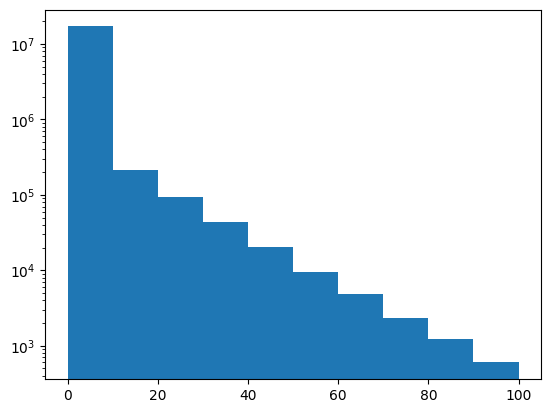

In [ ]:
plt.hist(s.g['v_disp']/s.g['cs'], range=(0,100))
plt.yscale('log')

In [ ]:
s.g['cs']

SimArray([ 26.01880117,  25.11196582,   5.69420517, ...,  87.93580332,
          110.81108386, 180.12819425], 'km s**-1')

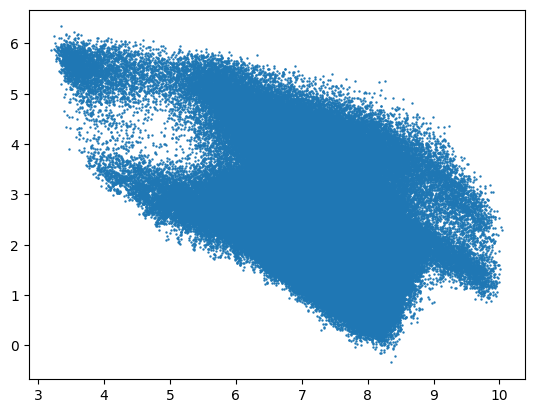

In [6]:
plt.scatter(np.log10(rho_W_50), np.log10(alpha_Pad_W_50), s= 0.5)

In [8]:
smooth_W_50

SimArray([0.14927252, 0.17999426, 0.40666896, ..., 0.23993097, 0.14550751,
          0.21033971], 'kpc')

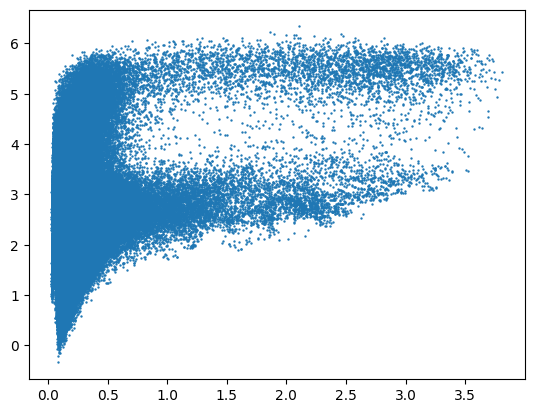

In [7]:
#alpha abhängig von smoothing length
plt.scatter(smooth_W_50, np.log10(alpha_Pad_W_50), s= 0.5)
#alpha abhängig von dichte

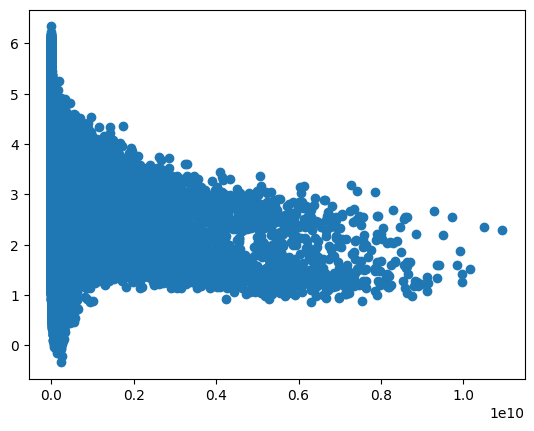

In [34]:
plt.scatter(rho_W_50, np.log10(alpha_Pad_W_50))

In [47]:
np.max(alpha_Hop_W_50[alpha_Hop_W_50<2])

SimArray(1.99991278, '1.00e+00')

2.9908155668682426
0.5401972812242268
1.885363274139308
0.5289906660945252
1.367613215226798
0.6675101585151062


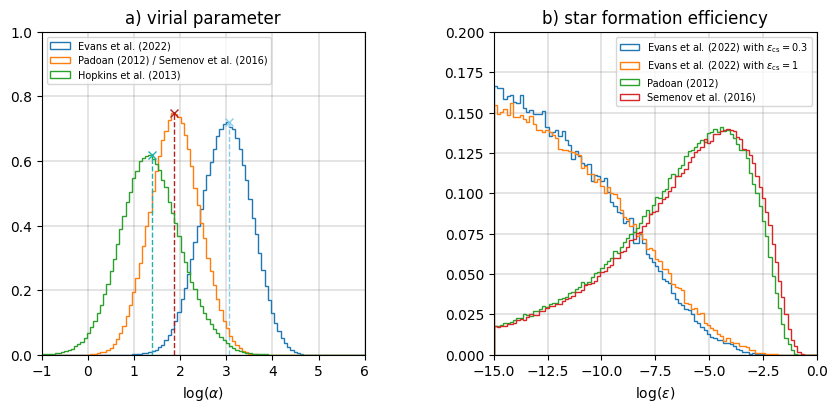

In [21]:
from scipy.optimize import curve_fit
def gauss_function(x, a, x0, sigma):
    return a*np.exp(-(x-x0)**2/(2*sigma**2))
alpha_list = [np.log10(alpha_vir_W_50), np.log10(alpha_Pad_W_50), np.log10(alpha_Hop_W_50)]
eff_list = [np.log10(eff_evans_0_3_W_50), np.log10(eff_evans_1_W_50), np.log10(eff_pad_W_50), np.log10(eff_sem_W_50)]
key_list = [alpha_list, eff_list]
range_list = [(-1, 6), (-15, 0)]
y_list = [(0, 1), (0, 0.2)]
title = ['a) virial parameter', 'b) star formation efficiency']
label_alpha = ['Evans et al. (2022)', 'Padoan (2012) / Semenov et al. (2016)', 'Hopkins et al. (2013)']
label_eff = [r'Evans et al. (2022) with $\epsilon_{\mathrm{cs}} = 0.3$', r'Evans et al. (2022) with $\epsilon_{\mathrm{cs}} = 1$',  'Padoan (2012) ', 'Semenov et al. (2016)']
label_list = [label_alpha, label_eff]
colorlist = ['skyblue', 'firebrick', 'lightseagreen']
loc = ['upper left', 'upper right']
unit = ['log('+r'$\alpha$'+')', 'log('+r'$\epsilon$'+')']
fig = plt.figure(figsize = (10,5))
gs0 = gd.GridSpec(1, 2, figure=fig, wspace = 0.4)

for n in range(2):
    ax = fig.add_subplot(gs0[n])
    for i in range(3):
        hist, bins, edges = ax.hist(key_list[n][i], bins = 100, label = label_list[n][i], range = range_list[n], histtype = 'step', density = True)
        if (n==0):
            #print(bins[np.argmax(hist)+1])
            #N = len(bins[:-1])
            mean = np.mean(key_list[n][i])
            sigma = np.sqrt(np.var(key_list[n][i]))
            #popt, pcov = curve_fit(gauss_function, bins[-1], hist, p0=[1,mean,sigma])
            #ax.plot(bins[-1], gauss_function(bins[-1], *popt), label='fit')
            print(mean)
            print(sigma)
            ax.plot(bins[np.argmax(hist)+1], hist.max(), "x", color = colorlist[i])
            ax.vlines(x=bins[np.argmax(hist)+1], ymax = hist.max(), ymin = 0, color = colorlist[i], linestyle = 'dashed', linewidth = 1)
    if (n==1):
        ax.hist(key_list[1][3], bins = 100, label = label_list[1][3], range = range_list[1], histtype = 'step', density = True)
    ax.legend(fontsize = 7, loc = loc[n])
    ax.set_title(title[n], wrap = True, fontsize = 12)
    ax.set_xlabel(unit[n])
    ax.set_xlim(range_list[n])
    ax.set_ylim(y_list[n])
    ax.set_aspect(1./ax.get_data_ratio())
    ax.grid(linewidth = 0.3, color = 'grey')

fig.savefig('../Documents/Bachelorthesis/alpha_eff_comparison_cold.png')

/tmp/ipykernel_244/3011593111.py:3: RuntimeWarning: invalid value encountered in log10
  v_div_list = [np.log10(vdiv_CS_50), np.log10(vdiv_W_50)]


7.640000000000001
7.613333333333333
1.7583333333333333
1.7583333333333333
1.86
1.74
4.08
3.8966666666666665


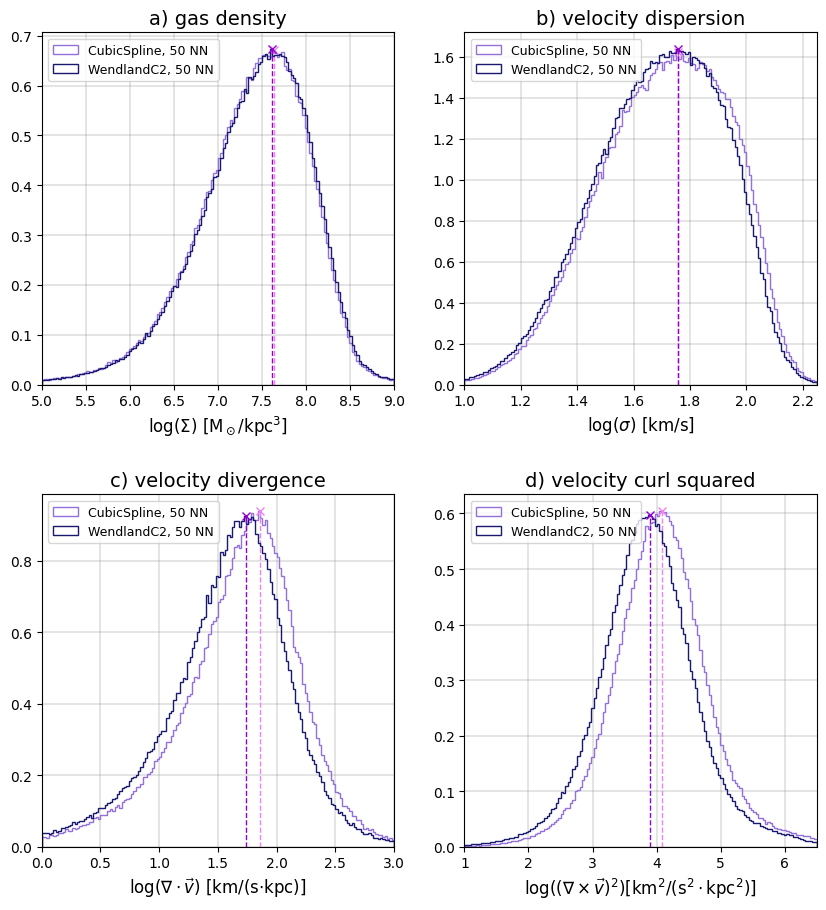

In [99]:
rho_list = [np.log10(rho_CS_50), np.log10(rho_W_50)]
v_disp_list = [np.log10(vdisp_CS_50), np.log10(vdisp_W_50)]
v_div_list = [np.log10(vdiv_CS_50), np.log10(vdiv_W_50)]
v_curl2_list = [np.log10(vcurl2_CS_50), np.log10(vcurl2_W_50)]
key_list = [rho_list, v_disp_list, v_div_list, v_curl2_list]
range_list = [(5, 9), (1, 2.25), (0, 3), (1, 6.5)]
color = ['mediumpurple', 'midnightblue']
colorlist = ['violet', 'darkviolet']
label2 = ['peakvalue CubicSpline', 'peakvalue WendlandC2']
title = ['a) gas density', 'b) velocity dispersion', 'c) velocity divergence', 'd) velocity curl squared']
unit = [r'log($\Sigma$) [M$_\odot$/kpc$^3$]', r'log($\sigma$) [km/s]', r'log($\nabla \cdot \vec{v}$) [km/(s$\cdot$kpc)]', r'log($(\nabla \times \vec{v})^2) [\mathrm{km}^2/(\mathrm{s}^2 \cdot \mathrm{kpc}^2)]$']
label = ['CubicSpline, 50 NN', 'WendlandC2, 50 NN']
fig = plt.figure(figsize = (10,11))
peaks2 = [[65, 68], [69, 0], [59, 59], [56,0]]
gs0 = gd.GridSpec(2, 2, figure=fig)

for n in range(4):
    ax = fig.add_subplot(gs0[n])
    for i in range(2):
        hist, bins, edges = ax.hist(key_list[n][i], bins = 150, label = label[i], range = range_list[n], histtype = 'step', density = True, color = color[i])
        print(bins[np.argmax(hist)+1])
        ax.plot(bins[np.argmax(hist)+1], hist.max(), "x", color = colorlist[i])
        ax.vlines(x=bins[np.argmax(hist)+1], ymax = hist.max(), ymin = 0, color = colorlist[i], linestyle = 'dashed', linewidth = 1)
    ax.set_title(title[n], wrap = True, fontsize = 14)
    ax.set_xlabel(unit[n], fontsize = 12)
    ax.set_xlim(range_list[n])
    ax.set_aspect(1./ax.get_data_ratio())
    ax.grid(linewidth = 0.3, color = 'grey')
    ax.legend(fontsize = 9, loc = 2)

fig.savefig('../Documents/Bachelorthesis/Kernels_comparison2.png')

In [ ]:
G = 6.68e-11*units.m**3*units.kg**(-1)*units.s**(-2)
t_ff = np.sqrt(3*np.pi/(32*G*rho_W_50.in_units('m^-3 kg^1')))
t_ff_2 = np.sqrt(3*np.pi/(32*G*rho_W_50_2.in_units('m^-3 kg^1')))
t_cr = (2*smooth_W_50).in_units('km')/(2*np.sqrt((vdisp_W_50)**2/3+gal.g['cs']**2))
t_cr_2 = (2*smooth_W_50_2).in_units('km')/(2*np.sqrt(vdisp_W_50_2**2/3+gal2.g['cs']**2))

In [ ]:
G = 6.68e-11*units.m**3*units.kg**(-1)*units.s**(-2)
t_ff_25 = np.sqrt(3*np.pi/(32*G*rho_W_25.in_units('m^-3 kg^1')))
t_ff_2_25 = np.sqrt(3*np.pi/(32*G*rho_W_25_2.in_units('m^-3 kg^1')))
t_cr_25 = (2*smooth_W_25).in_units('km')/(2*np.sqrt((vdisp_W_25)**2/3+gal.g['cs']**2))
t_cr_2_25 = (2*smooth_W_25_2).in_units('km')/(2*np.sqrt(vdisp_W_25_2**2/3+gal2.g['cs']**2))

/tmp/ipykernel_227/2387513059.py:3: RuntimeWarning: invalid value encountered in log10
  v_div_list = [np.log10(vdiv_W_25), np.log10(vdiv_W_50), np.log10(vdiv_W_100), np.log10(vdiv_W_200)]


7.77
7.62
7.5
7.53
1.7000000000000002
1.7375
1.75
1.7875
1.89
1.7999999999999998
1.71
1.53
4.025
3.915
3.64
3.53


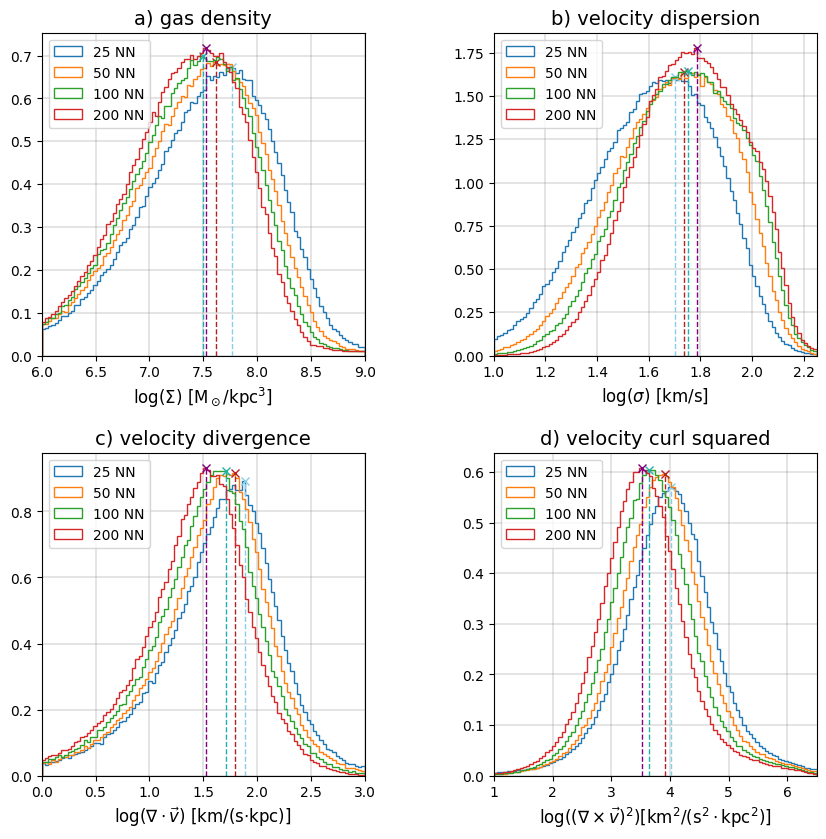

In [28]:
rho_list = [np.log10(rho_W_25), np.log10(rho_W_50), np.log10(rho_W_100), np.log10(rho_W_200)]
v_disp_list = [np.log10(vdisp_W_25), np.log10(vdisp_W_50), np.log10(vdisp_W_100), np.log10(vdisp_W_200)]
v_div_list = [np.log10(vdiv_W_25), np.log10(vdiv_W_50), np.log10(vdiv_W_100), np.log10(vdiv_W_200)]
v_curl2_list = [np.log10(vcurl2_W_25), np.log10(vcurl2_W_50), np.log10(vcurl2_W_100), np.log10(vcurl2_W_200)]
key_list = [rho_list, v_disp_list, v_div_list, v_curl2_list]
range_list = [(6, 9), (1, 2.25), (0, 3), (1, 6.5)]
colorlist = ['skyblue', 'firebrick', 'lightseagreen', 'purple']
label2 = ['peakvalue for 25 NN', 'peakvalue for 50 NN', 'peakvalue for 100 NN']
title = ['a) gas density', 'b) velocity dispersion', 'c) velocity divergence', 'd) velocity curl squared']
unit = [r'log($\Sigma$) [M$_\odot$/kpc$^3$]', r'log($\sigma$) [km/s]', r'log($\nabla \cdot \vec{v}$) [km/(s$\cdot$kpc)]', r'log($(\nabla \times \vec{v})^2) [\mathrm{km}^2/(\mathrm{s}^2 \cdot \mathrm{kpc}^2)]$']
label = ['25 NN', '50 NN', '100 NN', '200 NN']
fig = plt.figure(figsize = (10,10))
gs0 = gd.GridSpec(2, 2, figure=fig, wspace = 0.4)

for n in range(4):
    ax = fig.add_subplot(gs0[n])
    for i in range(4):
        hist, bins, edges = ax.hist(key_list[n][i], bins = 100, label = label[i], range = range_list[n], histtype = 'step', density = True)
        print(bins[np.argmax(hist)+1])
        ax.plot(bins[np.argmax(hist)+1], hist.max(), "x", color = colorlist[i])
        ax.vlines(x=bins[np.argmax(hist)+1], ymax = hist.max(), ymin = 0, color = colorlist[i], linestyle = 'dashed', linewidth = 1)
    ax.set_title(title[n], wrap = True, fontsize = 14)
    ax.set_xlabel(unit[n], fontsize = 12)
    ax.set_xlim(range_list[n])
    ax.set_aspect(1./ax.get_data_ratio())
    ax.grid(linewidth = 0.3, color = 'grey')
    ax.legend(fontsize = 10, loc = 2)
    fig.savefig('../Documents/Bachelorthesis/NN_comparison2.png')

/tmp/ipykernel_280/3966074124.py:3: RuntimeWarning: invalid value encountered in log10
  v_div_list = [np.log10(vdiv_CS_25), np.log10(vdiv_CS_50), np.log10(vdiv_CS_100), np.log10(vdiv_W_25), np.log10(vdiv_W_50), np.log10(vdiv_W_100)]


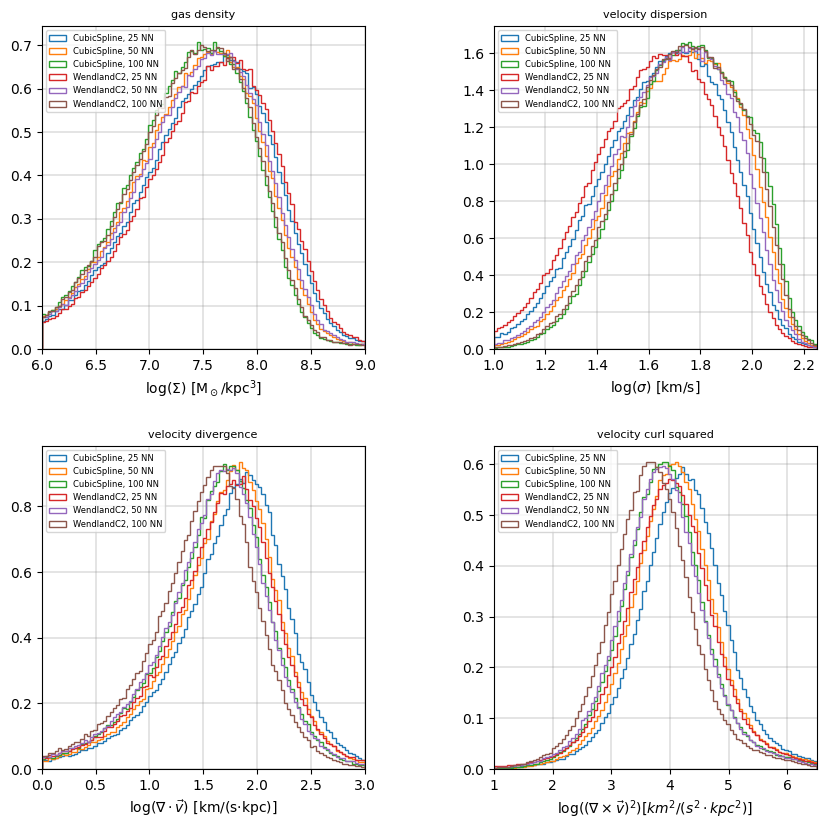

In [19]:
rho_list = [np.log10(rho_CS_25), np.log10(rho_CS_50), np.log10(rho_CS_100), np.log10(rho_W_25), np.log10(rho_W_50), np.log10(rho_W_100)]
v_disp_list = [np.log10(vdisp_CS_25), np.log10(vdisp_CS_50), np.log10(vdisp_CS_100), np.log10(vdisp_W_25), np.log10(vdisp_W_50), np.log10(vdisp_W_100)]
v_div_list = [np.log10(vdiv_CS_25), np.log10(vdiv_CS_50), np.log10(vdiv_CS_100), np.log10(vdiv_W_25), np.log10(vdiv_W_50), np.log10(vdiv_W_100)]
v_curl2_list = [np.log10(vcurl2_CS_25), np.log10(vcurl2_CS_50), np.log10(vcurl2_CS_100), np.log10(vcurl2_W_25), np.log10(vcurl2_W_50), np.log10(vcurl2_W_100)]
key_list = [rho_list, v_disp_list, v_div_list, v_curl2_list]
range_list = [(6, 9), (1, 2.25), (0, 3), (1, 6.5)]
title = ['gas density', 'velocity dispersion', 'velocity divergence', 'velocity curl squared']
unit = [r'log($\Sigma$) [M$_\odot$/kpc$^3$]', r'log($\sigma$) [km/s]', r'log($\nabla \cdot \vec{v}$) [km/(s$\cdot$kpc)]', r'log($(\nabla \times \vec{v})^2) [km^2/(s^2 \cdot kpc^2)]$']
label = ['CubicSpline, 25 NN', 'CubicSpline, 50 NN', 'CubicSpline, 100 NN', 'WendlandC2, 25 NN', 'WendlandC2, 50 NN', 'WendlandC2, 100 NN']
fig = plt.figure(figsize = (10,10))
gs0 = gd.GridSpec(2, 2, figure=fig, wspace = 0.4)

for n in range(4):
    ax = fig.add_subplot(gs0[n])
    for i in range(6):
        ax.hist(key_list[n][i], bins = 100, label = label[i], range = range_list[n], histtype = 'step', density = True)
        
    ax.set_title(title[n], wrap = True, fontsize = 8)
    ax.set_xlabel(unit[n])
    ax.set_xlim(range_list[n])
    ax.set_aspect(1./ax.get_data_ratio())
    ax.grid(linewidth = 0.3, color = 'grey')
    ax.legend(fontsize = 6, loc = 2)

/tmp/ipykernel_293/734546255.py:4: RuntimeWarning: divide by zero encountered in log10
  eff_evans_list = [np.log10(eff_evans_1_CS_50), np.log10(eff_evans_1_W_50)]
/tmp/ipykernel_293/734546255.py:5: RuntimeWarning: divide by zero encountered in log10
  eff_Hop_list = [np.log10(eff_sem_CS_50), np.log10(eff_sem_W_50)]
/tmp/ipykernel_293/734546255.py:6: RuntimeWarning: divide by zero encountered in log10
  eff_Pad_list = [np.log10(eff_pad_CS_50), np.log10(eff_pad_W_50)]


3.130000000000001
3.0600000000000005
2.0100000000000002
1.9400000000000004
1.6600000000000001
1.4500000000000002


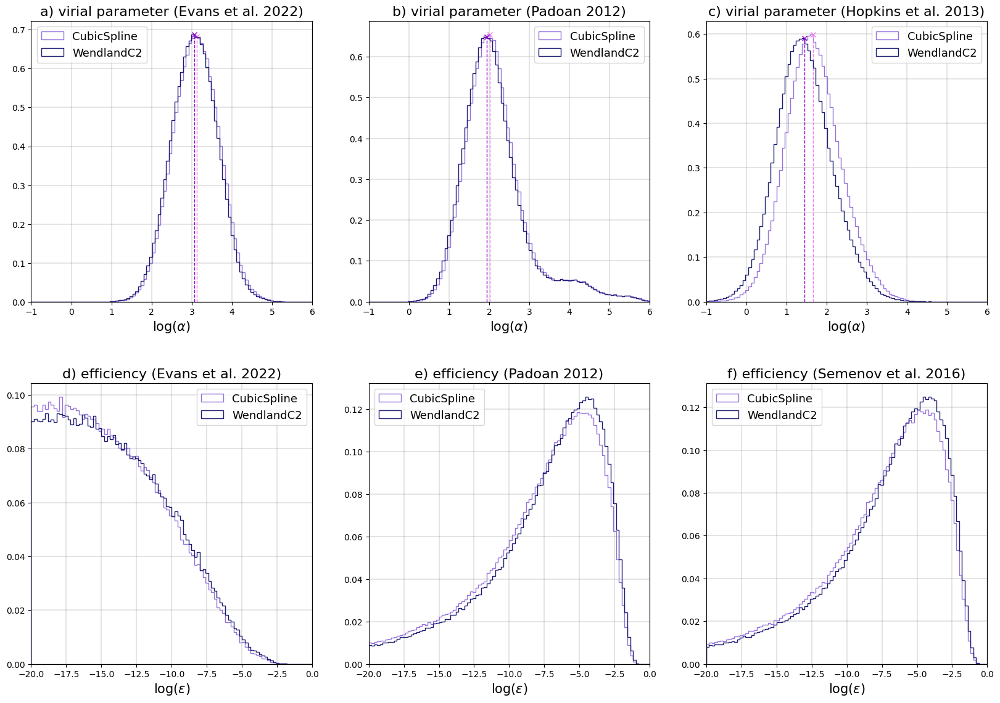

In [18]:
alpha_vir_list = [np.log10(alpha_vir_CS_50), np.log10(alpha_vir_W_50)]
alpha_Hop_list = [np.log10(alpha_Hop_CS_50), np.log10(alpha_Hop_W_50)]
alpha_Pad_list = [np.log10(alpha_Pad_CS_50), np.log10(alpha_Pad_W_50)]
eff_evans_list = [np.log10(eff_evans_1_CS_50), np.log10(eff_evans_1_W_50)]
eff_Hop_list = [np.log10(eff_sem_CS_50), np.log10(eff_sem_W_50)]
eff_Pad_list = [np.log10(eff_pad_CS_50), np.log10(eff_pad_W_50)]
key_list = [alpha_vir_list, alpha_Pad_list, alpha_Hop_list, eff_evans_list, eff_Pad_list, eff_Hop_list]
range_list = [(-1, 6), (-1, 6), (-1, 6), (-20, 0), (-20, 0), (-20, 0)]
color = ['mediumpurple', 'midnightblue']
colorlist = ['violet', 'darkviolet']
title = ['a) virial parameter (Evans et al. 2022)', 'b) virial parameter (Padoan 2012)', 'c) virial parameter (Hopkins et al. 2013)', 'd) efficiency (Evans et al. 2022)', 'e) efficiency (Padoan 2012)', 'f) efficiency (Semenov et al. 2016)']
unit = ['log('+r'$\alpha$'+')', 'log('+r'$\alpha$'+')', 'log('+r'$\alpha$'+')', 'log('+r'$\epsilon$'+')', 'log('+r'$\epsilon$'+')', 'log('+r'$\epsilon$'+')']
label = ['CubicSpline', 'WendlandC2']
label2 = ['peakvalue CubicSpline', 'peakvalue WendlandC2']
loc = ['upper left', 'upper right', 'upper right', 'upper right', 'upper left', 'upper left']
fig = plt.figure(figsize = (20,14))
gs0 = gd.GridSpec(2, 3, figure=fig)

for n in range(6):
    ax = fig.add_subplot(gs0[n])
    for i in range(2):
        hist, bins, edges = ax.hist(key_list[n][i], bins = 100, label = label[i], range = range_list[n], histtype = 'step', density = True, color = color[i])
        if (n<3):
            print(bins[np.argmax(hist)+1])
            ax.plot(bins[np.argmax(hist)+1], hist.max(), "x", color = colorlist[i])
            ax.vlines(x=bins[np.argmax(hist)+1], ymax = hist.max(), ymin = 0, color = colorlist[i], linestyle = 'dashed', linewidth = 1)
    ax.set_title(title[n], wrap = True, fontsize = 16)
    ax.set_xlabel(unit[n], fontsize = 15)
    ax.set_xlim(range_list[n])
    ax.set_aspect(1./ax.get_data_ratio())
    ax.grid(linewidth = 0.3, color = 'grey')
    ax.legend(fontsize = 13, loc = loc[n])
    
fig.savefig('../Documents/Bachelorthesis/Kernels_a_e_comparison.png')

In [27]:
alpha_vir_list = [np.log10(alpha_vir_CS_25), np.log10(alpha_vir_CS_50), np.log10(alpha_vir_CS_100), np.log10(alpha_vir_W_25), np.log10(alpha_vir_W_50), np.log10(alpha_vir_W_100)]
alpha_Hop_list = [np.log10(alpha_Hop_CS_25), np.log10(alpha_Hop_CS_50), np.log10(alpha_Hop_CS_100), np.log10(alpha_Hop_W_25), np.log10(alpha_Hop_W_50), np.log10(alpha_Hop_W_100)]
alpha_Pad_list = [np.log10(alpha_Pad_CS_25), np.log10(alpha_Pad_CS_50), np.log10(alpha_Pad_CS_100), np.log10(alpha_Pad_W_25), np.log10(alpha_Pad_W_50), np.log10(alpha_Pad_W_100)]
eff_vir_list = [np.log10(eff_vir_CS_25), np.log10(eff_vir_CS_50), np.log10(eff_vir_CS_100), np.log10(eff_vir_W_25), np.log10(eff_vir_W_50), np.log10(eff_vir_W_100)]
eff_Hop_list = [np.log10(eff_Hop_CS_25), np.log10(eff_Hop_CS_50), np.log10(eff_Hop_CS_100), np.log10(eff_Hop_W_25), np.log10(eff_Hop_W_50), np.log10(eff_Hop_W_100)]
eff_Pad_list = [np.log10(eff_Pad_CS_25), np.log10(eff_Pad_CS_50), np.log10(eff_Pad_CS_100), np.log10(eff_Pad_W_25), np.log10(eff_Pad_W_50), np.log10(eff_Pad_W_100)]
key_list = [alpha_vir_list, alpha_Pad_list, alpha_Hop_list, eff_vir_list, eff_Pad_list, eff_Pad_list]
range_list = [(0, 5),(0, 5), (-1, 5), (-5, 0), (-5, 0), (-5, 0)]
title = ['virial parameter (with literature definition)', 'virial parameter (Padoan et al.)', 'virial parameter (Hopkins et al.)', 'efficiency (with literature definition)', 'efficiency (Padoan et al.)', 'efficiency (Hopkins et al.)']
unit = ['log('+r'$\alpha$'+')', 'log('+r'$\alpha$'+')', 'log('+r'$\alpha$'+')', 'log('+r'$\epsilon$'+')', 'log('+r'$\epsilon$'+')', 'log('+r'$\epsilon$'+')']
label = ['CubicSpline, 25 NN', 'CubicSpline, 50 NN', 'CubicSpline, 100 NN', 'WendlandC2, 25 NN', 'WendlandC2, 50 NN', 'WendlandC2, 100 NN']
loc = ['upper left', 'upper right', 'upper right', 'upper right', 'upper right', 'upper right']
fig = plt.figure(figsize = (15,10))
gs0 = gd.GridSpec(2, 3, figure=fig, wspace = 0.4)

for n in range(6):
    ax = fig.add_subplot(gs0[n])
    for i in range(6):
        ax.hist(key_list[n][i], bins = 100, label = label[i], range = range_list[n], histtype = 'step', density = True)
        
    ax.set_title(title[n], wrap = True, fontsize = 8)
    ax.set_xlabel(unit[n], fontsize = 15)
    ax.set_xlim(range_list[n])
    ax.set_aspect(1./ax.get_data_ratio())
    ax.grid(linewidth = 0.3, color = 'grey')
    ax.legend(fontsize = 6, loc = loc[n])

/tmp/ipykernel_227/4007030424.py:4: RuntimeWarning: divide by zero encountered in log10
  eff_vir_list = [np.log10(eff_vir_CS_25), np.log10(eff_vir_CS_50), np.log10(eff_vir_CS_100), np.log10(eff_vir_W_25), np.log10(eff_vir_W_50), np.log10(eff_vir_W_100)]


NameError: name 'eff_vir_CS_50' is not defined

/tmp/ipykernel_227/1941196485.py:4: RuntimeWarning: divide by zero encountered in log10
  eff_vir_list = [np.log10(eff_evans_1_W_25), np.log10(eff_evans_1_W_50), np.log10(eff_evans_1_W_100), np.log10(eff_evans_1_W_200)]
/tmp/ipykernel_227/1941196485.py:5: RuntimeWarning: divide by zero encountered in log10
  eff_Hop_list = [np.log10(eff_sem_W_25), np.log10(eff_sem_W_50), np.log10(eff_sem_W_100), np.log10(eff_sem_W_200)]
/tmp/ipykernel_227/1941196485.py:6: RuntimeWarning: divide by zero encountered in log10
  eff_Pad_list = [np.log10(eff_pad_W_25), np.log10(eff_pad_W_50), np.log10(eff_pad_W_100), np.log10(eff_pad_W_200)]


(array([20.47143297]), array([0.33086152]), array([44.7917779]), array([65.26321087]))
(array([19.81880643]), array([0.34428364]), array([47.61118914]), array([67.42999557]))
(array([18.53592215]), array([0.36260836]), array([49.48778045]), array([68.02370259]))
(array([16.84082114]), array([0.39173646]), array([51.09236326]), array([67.9331844]))
(array([19.82041363]), array([0.30880315]), array([31.97559524]), array([51.79600887]))
(array([18.83557188]), array([0.32491673]), array([31.75617547]), array([50.59174735]))
(array([17.02592477]), array([0.34915028]), array([30.90167279]), array([47.92759756]))
(array([15.53653202]), array([0.37101859]), array([29.6473036]), array([45.18383562]))
(array([22.46914141]), array([0.29008352]), array([22.81696751]), array([45.28610892]))
(array([21.98700768]), array([0.29605164]), array([22.64036458]), array([44.62737226]))
(array([21.51591847]), array([0.3047726]), array([21.56609808]), array([43.08201655]))
(array([20.86759694]), array([0.3132

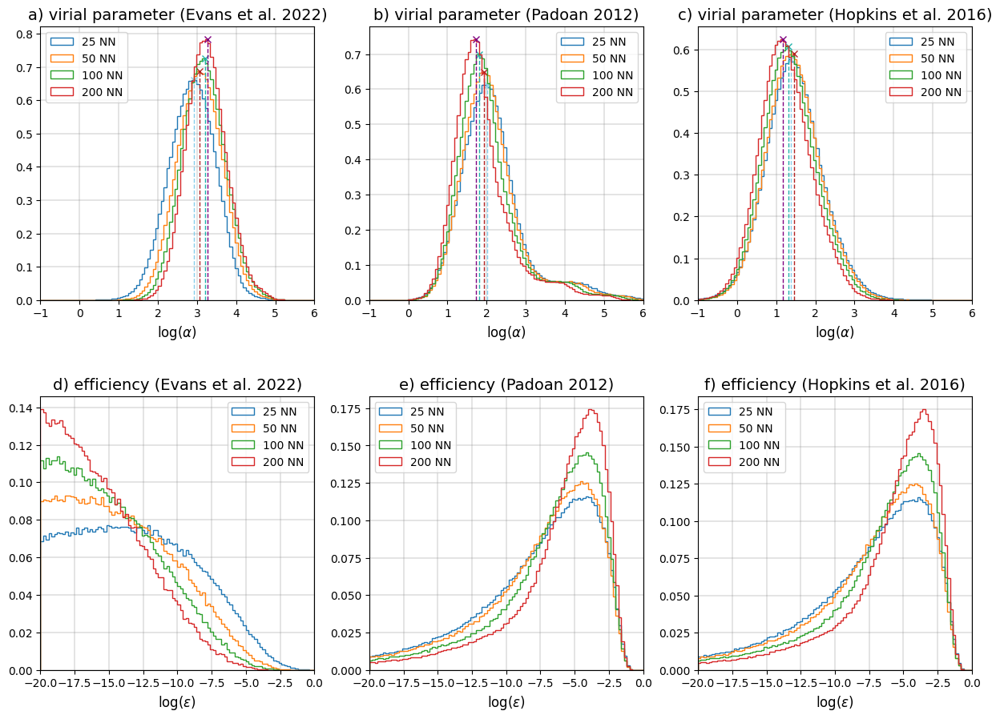

In [26]:
alpha_vir_list = [np.log10(alpha_vir_W_25), np.log10(alpha_vir_W_50), np.log10(alpha_vir_W_100), np.log10(alpha_vir_W_200)]
alpha_Hop_list = [np.log10(alpha_Hop_W_25), np.log10(alpha_Hop_W_50), np.log10(alpha_Hop_W_100), np.log10(alpha_Hop_W_200)]
alpha_Pad_list = [np.log10(alpha_Pad_W_25), np.log10(alpha_Pad_W_50), np.log10(alpha_Pad_W_100), np.log10(alpha_Pad_W_200)]
eff_vir_list = [np.log10(eff_evans_1_W_25), np.log10(eff_evans_1_W_50), np.log10(eff_evans_1_W_100), np.log10(eff_evans_1_W_200)]
eff_Hop_list = [np.log10(eff_sem_W_25), np.log10(eff_sem_W_50), np.log10(eff_sem_W_100), np.log10(eff_sem_W_200)]
eff_Pad_list = [np.log10(eff_pad_W_25), np.log10(eff_pad_W_50), np.log10(eff_pad_W_100), np.log10(eff_pad_W_200)]
key_list = [alpha_vir_list, alpha_Pad_list, alpha_Hop_list, eff_vir_list, eff_Pad_list, eff_Hop_list]
range_list = [(-1, 6),(-1, 6), (-1, 6), (-20, 0), (-20, 0), (-20, 0)]
colorlist = ['skyblue', 'firebrick', 'lightseagreen', 'purple']
title = ['a) virial parameter (Evans et al. 2022)', 'b) virial parameter (Padoan 2012)', 'c) virial parameter (Hopkins et al. 2016)', 'd) efficiency (Evans et al. 2022)', 'e) efficiency (Padoan 2012)', 'f) efficiency (Hopkins et al. 2016)']
unit = ['log('+r'$\alpha$'+')', 'log('+r'$\alpha$'+')', 'log('+r'$\alpha$'+')', 'log('+r'$\epsilon$'+')', 'log('+r'$\epsilon$'+')', 'log('+r'$\epsilon$'+')']
label = ['25 NN', '50 NN', '100 NN', '200 NN']
loc = ['upper left', 'upper right', 'upper right', 'upper right', 'upper left', 'upper left']
fig = plt.figure(figsize = (15,11))
gs0 = gd.GridSpec(2, 3, figure=fig)

for n in range(6):
    ax = fig.add_subplot(gs0[n])
    for i in range(4):
        hist, bins, edges = ax.hist(key_list[n][i], bins = 100, label = label[i], range = range_list[n], histtype = 'step', density = True)
        if (n<3):
            #print(bins[np.argmax(hist)+1])
            ax.plot(bins[np.argmax(hist)+1], hist.max(), "x", color = colorlist[i])
            ax.vlines(x=bins[np.argmax(hist)+1], ymax = hist.max(), ymin = 0, color = colorlist[i], linestyle = 'dashed', linewidth = 1)
            print(peak_widths(hist, [np.argmax(hist)]))
    ax.set_title(title[n], wrap = True, fontsize = 14)
    ax.set_xlabel(unit[n], fontsize = 12)
    ax.set_xlim(range_list[n])
    ax.set_aspect(1./ax.get_data_ratio())
    ax.grid(linewidth = 0.3, color = 'grey')
    ax.legend(fontsize = 10, loc = loc[n])

fig.savefig('../Documents/Bachelorthesis/NN_a_e_comparison2.png')

/tmp/ipykernel_227/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass


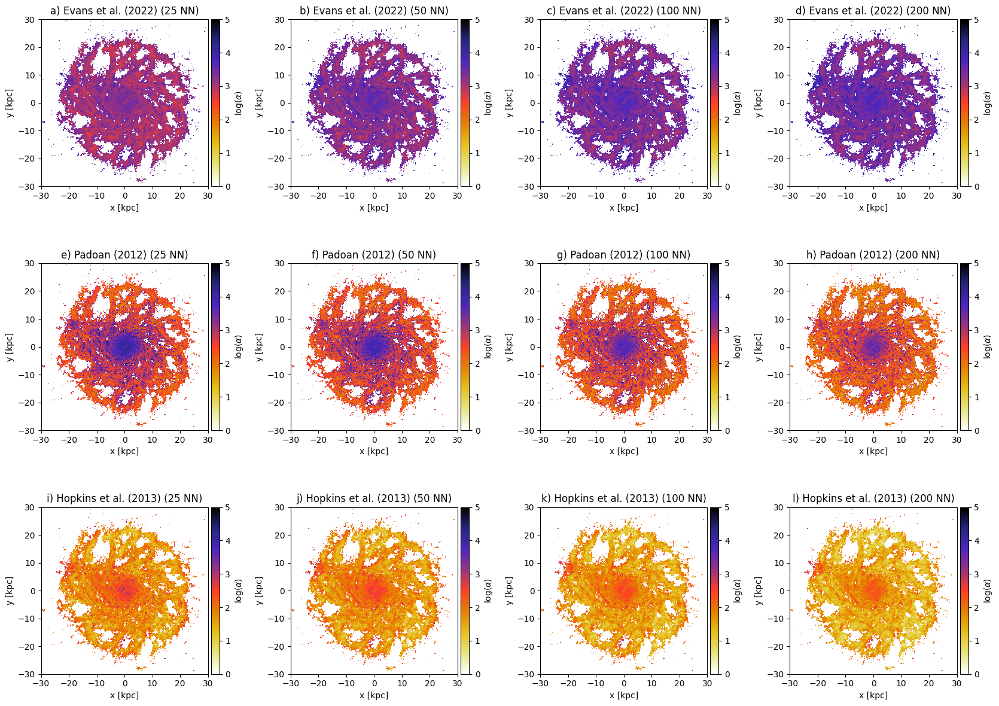

In [33]:
title = ['a) Evans et al. (2022) (25 NN)', 'b) Evans et al. (2022) (50 NN)', 'c) Evans et al. (2022) (100 NN)', 'd) Evans et al. (2022) (200 NN)', 'e) Padoan (2012) (25 NN)', 'f) Padoan (2012) (50 NN)', 'g) Padoan (2012) (100 NN)','h) Padoan (2012) (200 NN)', 'i) Hopkins et al. (2013) (25 NN)', 'j) Hopkins et al. (2013) (50 NN)', 'k) Hopkins et al. (2013) (100 NN)', 'l) Hopkins et al. (2013) (200 NN)']
alpha = [alpha_vir_W_25, alpha_vir_W_50, alpha_vir_W_100, alpha_vir_W_200, alpha_Pad_W_25, alpha_Pad_W_50, alpha_Pad_W_100, alpha_Pad_W_200, alpha_Hop_W_25, alpha_Hop_W_50, alpha_Hop_W_100, alpha_Hop_W_200]
vmin_list = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
vmax_list = [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
fig = plt.figure(figsize = (20, 15))
gs0 = gd.GridSpec(3, 4, figure=fig, wspace = 0.4)

for n in range(12):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(np.log10(mw_hist(gal.g, alpha[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = r'log($\alpha$)')
    ax.set_title(title[n], wrap = True, fontsize = 12)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())
    
plt.show()
fig.savefig('../Documents/Bachelorthesis/NN_check_alpha2.png')

/tmp/ipykernel_293/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass


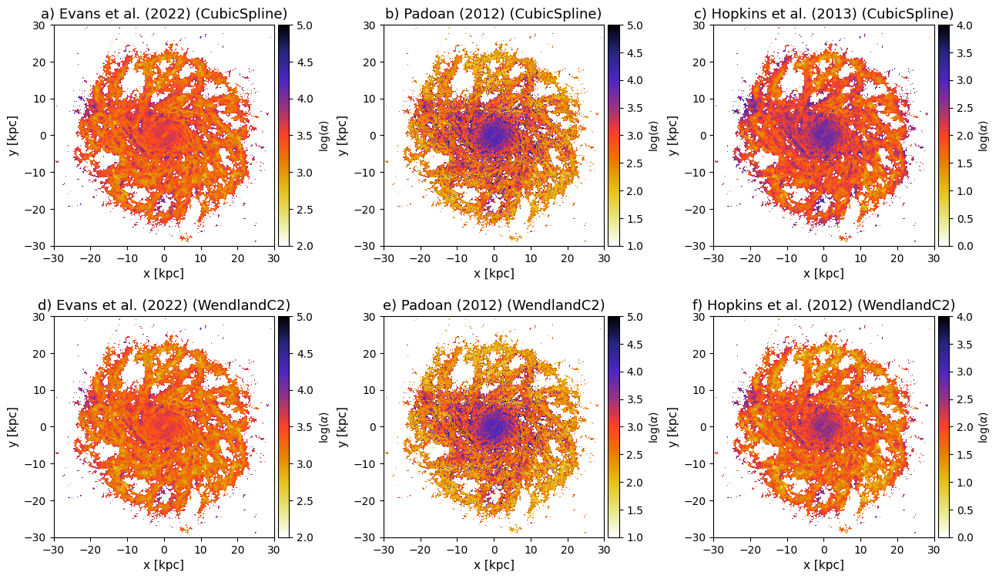

In [41]:
title = ['a) Evans et al. (2022) (CubicSpline)', 'b) Padoan (2012) (CubicSpline)', 'c) Hopkins et al. (2013) (CubicSpline)', 'd) Evans et al. (2022) (WendlandC2)', 'e) Padoan (2012) (WendlandC2)', 'f) Hopkins et al. (2012) (WendlandC2)']
alpha = [alpha_vir_CS_50, alpha_Pad_CS_50, alpha_Hop_CS_50, alpha_vir_W_50, alpha_Pad_W_50, alpha_Hop_W_50]
vmin_list = [2, 1, 0, 2, 1, 0]
vmax_list = [5, 5, 4, 5, 5, 4]
fig = plt.figure(figsize = (15, 9))
gs0 = gd.GridSpec(2, 3, figure=fig, wspace = 0.4)

for n in range(6):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(np.log10(mw_hist(gal.g, alpha[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = r'log($\alpha$)')
    ax.set_title(title[n], wrap = True, fontsize = 13)
    ax.set_xlabel('x [kpc]', fontsize = 11)
    ax.set_ylabel('y [kpc]', fontsize = 11)
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())
    
plt.show()
fig.savefig('../Documents/Bachelorthesis/Kernel_check_alpha2.png')

/tmp/ipykernel_4901/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass
/tmp/ipykernel_4901/559991286.py:10: RuntimeWarning: divide by zero encountered in log10
  im = ax.imshow(np.log10(mw_hist(gal.g, eff[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])


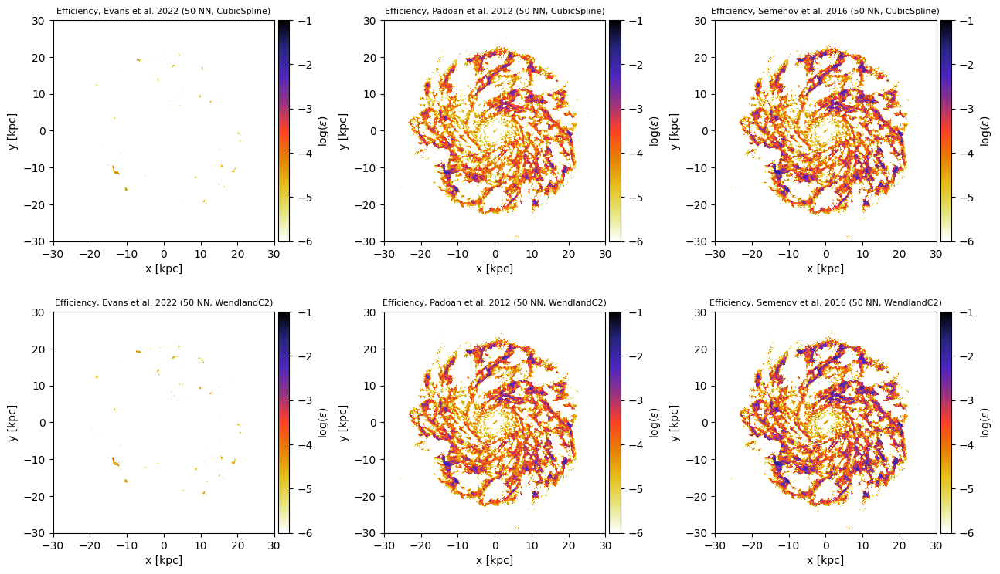

In [99]:
title = ['Evans et al. 2022 (50 NN, CubicSpline)', 'Padoan et al. 2012 (50 NN, CubicSpline)', 'Semenov et al. 2016 (50 NN, CubicSpline)', 'Evans et al. 2022 (50 NN, WendlandC2)', 'Padoan et al. 2012 (50 NN, WendlandC2)', 'Semenov et al. 2016 (50 NN, WendlandC2)']
eff = [eff_evans_1_CS_50, eff_pad_CS_50, eff_sem_CS_50, eff_evans_1_W_50, eff_pad_W_50, eff_sem_W_50]
vmax_list = [-1, -1, -1, -1, -1, -1]
vmin_list = [-6, -6, -6, -6, -6, -6]
fig = plt.figure(figsize = (15, 9))
gs0 = gd.GridSpec(2, 3, figure=fig, wspace = 0.4)

for n in range(6):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(np.log10(mw_hist(gal.g, eff[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = r'log($\epsilon$)')
    ax.set_title('Efficiency, ' + title[n], wrap = True, fontsize = 8)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())
    
plt.show()
fig.savefig('../Documents/Bachelorthesis/Kernel_check_eff2.png')

/tmp/ipykernel_350/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass
/tmp/ipykernel_350/2720170522.py:10: RuntimeWarning: divide by zero encountered in log10
  im = ax.imshow(np.log10(mw_hist(gal.g, eff[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])


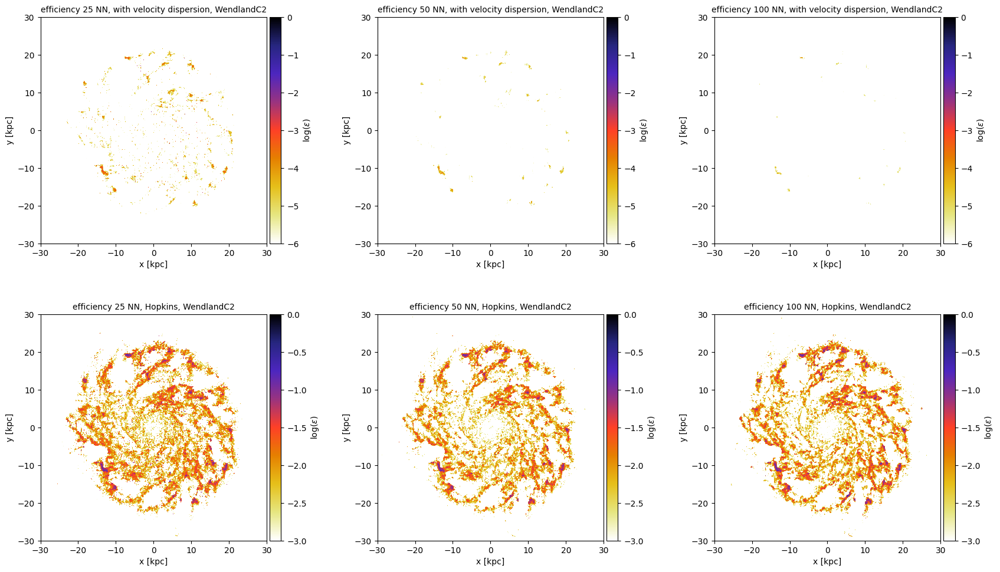

In [24]:
title = ['25 NN, with velocity dispersion, WendlandC2', '50 NN, with velocity dispersion, WendlandC2', '100 NN, with velocity dispersion, WendlandC2', '25 NN, Hopkins, WendlandC2', '50 NN, Hopkins, WendlandC2', '100 NN, Hopkins, WendlandC2']
eff = [eff_vir_W_25, eff_vir_W_50, eff_vir_W_100, eff_Hop_W_25, eff_Hop_W_50, eff_Hop_W_100]
fig = plt.figure(figsize = (20,12))
gs0 = gd.GridSpec(2, 3, figure=fig, wspace = 0.4)
vmin_list = [-6, -6, -6, -3, -3, -3]
vmax_list = [0, 0, 0, 0, 0, 0]

for n in range(6):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(np.log10(mw_hist(gal.g, eff[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = r'log($\epsilon$)')
    ax.set_title('efficiency ' + title[n], wrap = True, fontsize = 10)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())

plt.show()

In [37]:
G = 6.68e-11*units.m**3*units.kg**(-1)*units.s**(-2)
t_ff = np.sqrt(3*np.pi/(32*G*rho_W_50.in_units('m^-3 kg^1')))
t_ff_2 = np.sqrt(3*np.pi/(32*G*rho_W_50_2.in_units('m^-3 kg^1')))
t_cr = (2*smooth_W_50).in_units('km')/(2*np.sqrt((vdisp_W_50)**2/3+gal['cs']**2))
t_cr_2 = (2*smooth_W_50_2).in_units('km')/(2*np.sqrt(vdisp_W_50_2**2/3+gal2['cs']**2))

/tmp/ipykernel_1762/601224651.py:5: RuntimeWarning: invalid value encountered in log10
  v_div_list = [np.log10(vdiv_W_50_2), np.log10(vdiv_W_50)]


1.7672841069348801
1.7084844318244512
10.718027369208539
10.793916747155823
14.511951484885655
14.37772936925475
1.4880016526396882
1.7507966452330277
3.3295233832359026
3.9342157331034646
0.29995358742104206
0.3038427010786549
7.767907356468985
7.617159073127883
3.65934927556825
4.024272594216689
-3.6362631119924274
-3.4201372230192986


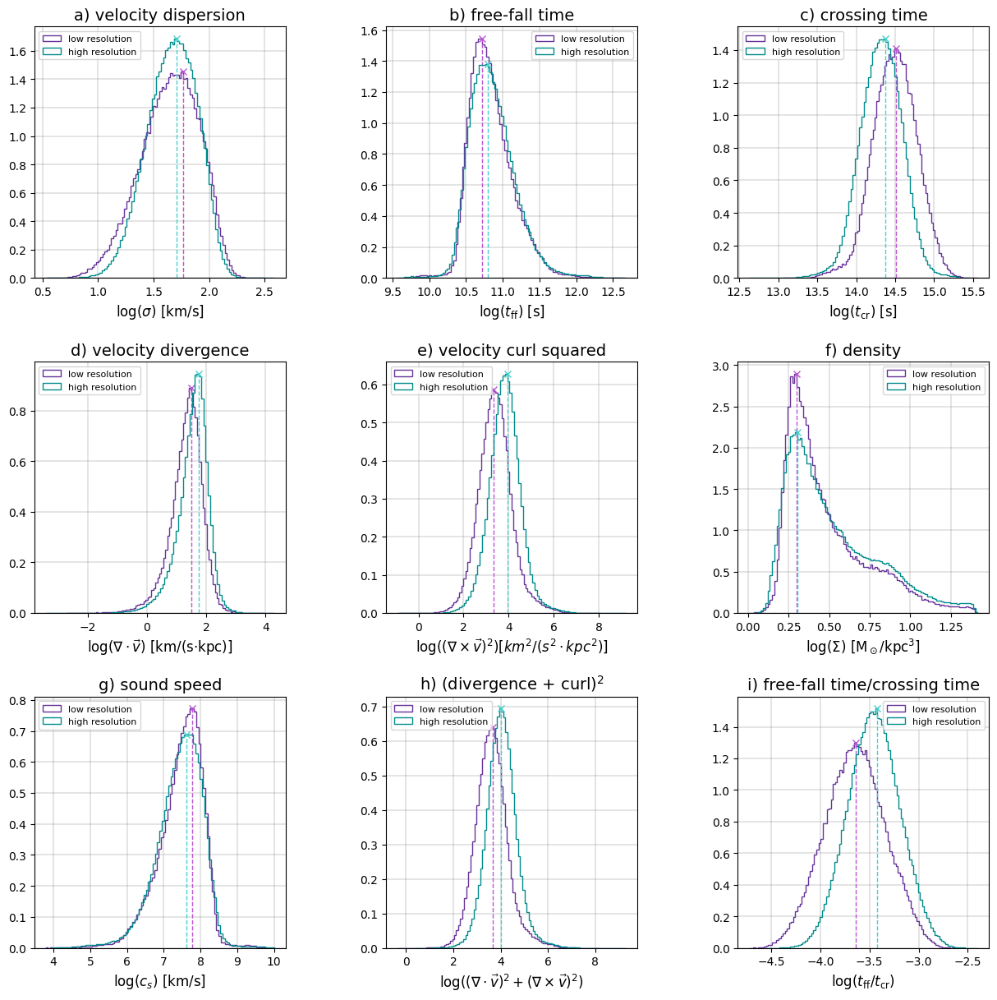

In [40]:
cs_list = [np.log10(gal2.g['cs']), np.log10(gal.g['cs'])]
v_disp_list = [np.log10(vdisp_W_50_2), np.log10(vdisp_W_50)]
tff_list = [np.log10(t_ff_2), np.log10(t_ff)]
tcr_list = np.log10(t_cr_2), np.log10(t_cr)
v_div_list = [np.log10(vdiv_W_50_2), np.log10(vdiv_W_50)]
v_curl2_list = [np.log10(vcurl2_W_50_2), np.log10(vcurl2_W_50)]
rho_list = [np.log10(rho_W_50_2), np.log10(rho_W_50)]
divcurl_list = [np.log10((vdiv_W_50_2)**2 + vcurl2_W_50_2), np.log10((vdiv_W_50)**2 + vcurl2_W_50)]
tfftcr_list = [np.log10(t_ff_2/t_cr_2), np.log10(t_ff/t_cr)]
key_list = [v_disp_list, tff_list, tcr_list, v_div_list, v_curl2_list, cs_list, rho_list, divcurl_list, tfftcr_list]
color = ['rebeccapurple', 'darkcyan']
colorlist = ['mediumorchid', 'mediumturquoise']
loclist = ['upper left', 'upper right', 'upper left', 'upper left', 'upper left', 'upper right', 'upper left', 'upper left', 'upper right']
range_list = [(6, 9), (1, 2.25), (0, 3), (1, 6.5)]
title = ['a) velocity dispersion', 'b) free-fall time', 'c) crossing time', 'd) velocity divergence', 'e) velocity curl squared', 'f) density', 'g) sound speed', r'h) (divergence + curl$)^2$', 'i) free-fall time/crossing time']
unit = [r'log($\sigma$) [km/s]', r'log($t_{\mathrm{ff}}$) [s]', r'log($t_{\mathrm{cr}}$) [s]', r'log($\nabla \cdot \vec{v}$) [km/(s$\cdot$kpc)]', r'log($(\nabla \times \vec{v})^2) [km^2/(s^2 \cdot kpc^2)]$', r'log($\Sigma$) [M$_\odot$/kpc$^3$]', r'log($c_s$) [km/s]', r'log($(\nabla \cdot \vec{v})^2+(\nabla \times \vec{v})^2$)', r'log($t_{\mathrm{ff}}/t_{\mathrm{cr}}$)']
label = ['low resolution', 'high resolution']
fig = plt.figure(figsize = (15,15))
gs0 = gd.GridSpec(3, 3, figure=fig, wspace = 0.4)

for n in range(9):
    ax = fig.add_subplot(gs0[n])
    for i in range(2):
        hist, bins, edges = ax.hist(key_list[n][i], bins = 100, label = label[i], color = color[i], histtype = 'step', density = True)
        print(bins[np.argmax(hist)+1])
        ax.plot(bins[np.argmax(hist)+1], hist.max(), "x", color = colorlist[i])
        ax.vlines(x=bins[np.argmax(hist)+1], ymax = hist.max(), ymin = 0, color = colorlist[i], linestyle = 'dashed', linewidth = 1)
    ax.set_title(title[n], wrap = True, fontsize = 14)
    ax.set_xlabel(unit[n], fontsize = 12)
    #ax.set_xlim(range_list[n])
    ax.set_aspect(1./ax.get_data_ratio())
    ax.grid(linewidth = 0.3, color = 'grey')
    ax.legend(fontsize = 8, loc = loclist[n])

fig.savefig('../Documents/Bachelorthesis/resolution_com_cold.png')

2.5933333333333337
3.0600000000000005
1.5666666666666669
1.94
0.8433333333333335
1.38


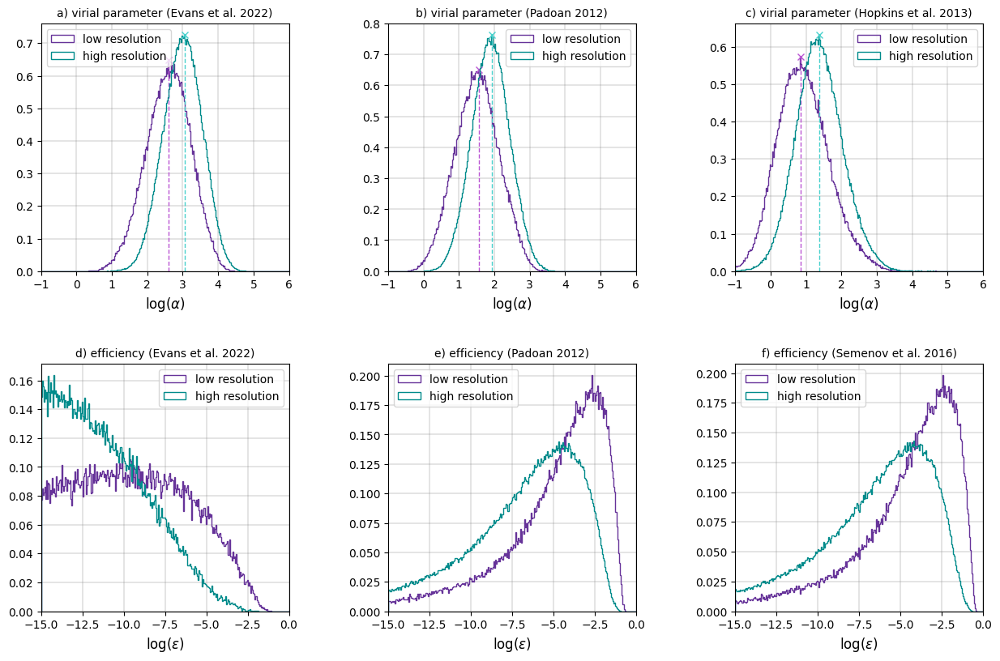

In [41]:
#histogramme 
alpha_vir = [alpha_vir_W_50_2, alpha_vir_W_50]
alpha_Pad = [alpha_Pad_W_50_2, alpha_Pad_W_50]
alpha_Hop = [alpha_Hop_W_50_2, alpha_Hop_W_50]
eff_vir = [eff_evans_1_W_50_2, eff_evans_1_W_50]
eff_Pad = [eff_pad_W_50_2, eff_pad_W_50]
eff_Hop = [eff_sem_W_50_2, eff_sem_W_50]
key_list = [alpha_vir, alpha_Pad, alpha_Hop, eff_vir, eff_Pad, eff_Hop]
range_list = [(-1, 6),(-1, 6), (-1, 6), (-15, 0), (-15, 0), (-15, 0)]
title = ['a) virial parameter (Evans et al. 2022)', 'b) virial parameter (Padoan 2012)', 'c) virial parameter (Hopkins et al. 2013)', 'd) efficiency (Evans et al. 2022)', 'e) efficiency (Padoan 2012)', 'f) efficiency (Semenov et al. 2016)']
unit = ['log('+r'$\alpha$'+')', 'log('+r'$\alpha$'+')', 'log('+r'$\alpha$'+')', 'log('+r'$\epsilon$'+')', 'log('+r'$\epsilon$'+')', 'log('+r'$\epsilon$'+')']
label = ['low resolution', 'high resolution']
color = ['rebeccapurple', 'darkcyan']
colorlist = ['mediumorchid', 'mediumturquoise']
loc = ['upper left', 'upper right', 'upper right', 'upper right', 'upper left', 'upper left']
fig = plt.figure(figsize = (15,10))
gs0 = gd.GridSpec(2, 3, figure=fig, wspace = 0.4)

for n in range(6):
    ax = fig.add_subplot(gs0[n])
    for i in range(2):
        hist, bins, edges = ax.hist(np.log10(key_list[n][i]), bins = 300, range = range_list[n], label = label[i], color = color[i], histtype = 'step', density = True)
        if (n<3):
            print(bins[np.argmax(hist)+1])
            ax.plot(bins[np.argmax(hist)+1], hist.max(), "x", color = colorlist[i])
            ax.vlines(x=bins[np.argmax(hist)+1], ymax = hist.max(), ymin = 0, color = colorlist[i], linestyle = 'dashed', linewidth = 1)  
    ax.set_title(title[n], wrap = True, fontsize = 10)
    ax.set_xlabel(unit[n], fontsize = 12)
    ax.set_xlim(range_list[n])
    ax.grid(linewidth = 0.3, color = 'grey')
    ax.set_aspect(1./ax.get_data_ratio())
    ax.legend(fontsize = 10, loc = loc[n])

fig.savefig('../Documents/Bachelorthesis/resolution_comparison2_cold.png')

/tmp/ipykernel_1762/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass


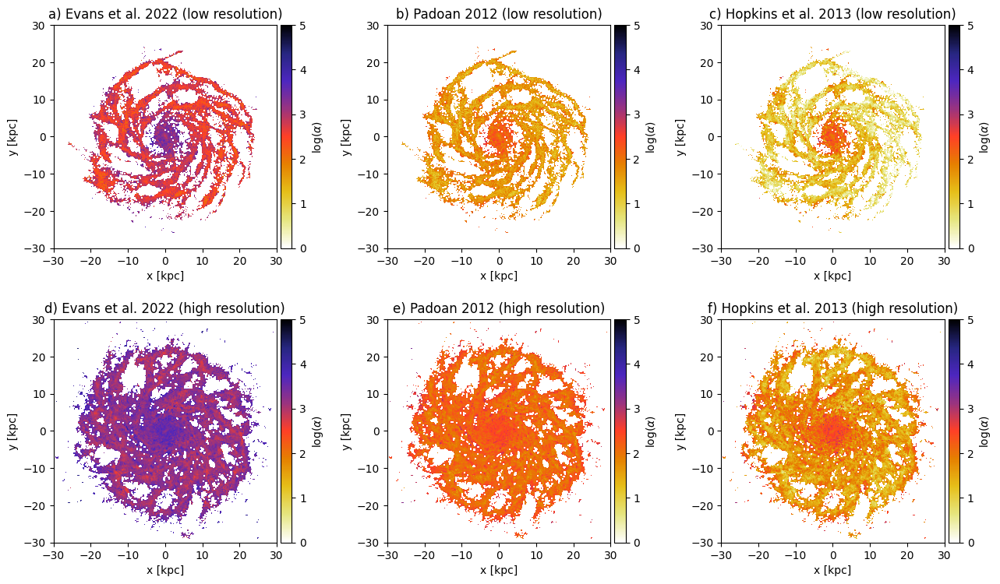

In [42]:
title = ['a) Evans et al. 2022 (low resolution)', 'b) Padoan 2012 (low resolution)', 'c) Hopkins et al. 2013 (low resolution)', 'd) Evans et al. 2022 (high resolution)', 'e) Padoan 2012 (high resolution)', 'f) Hopkins et al. 2013 (high resolution)']
alpha = [alpha_vir_W_50_2, alpha_Pad_W_50_2, alpha_Hop_W_50_2, alpha_vir_W_50, alpha_Pad_W_50, alpha_Hop_W_50]
vmin_list = [0, 0, 0, 0, 0, 0]
vmax_list = [5, 5, 5, 5, 5, 5]
fig = plt.figure(figsize = (15, 9))
gs0 = gd.GridSpec(2, 3, figure=fig, wspace = 0.4)

for n in range(3):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(np.log10(mw_hist(gal2.g, alpha[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = r'log($\alpha$)')
    ax.set_title( title[n], wrap = True, fontsize = 12)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())
    
for n in range(3, 6):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(np.log10(mw_hist(gal.g, alpha[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = r'log($\alpha$)')
    ax.set_title(title[n], wrap = True, fontsize = 12)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())
    
plt.show()
fig.savefig('../Documents/Bachelorthesis/Resolution_check_alpha2_cold.png')

In [54]:
len(alpha_Hop_conv_W_50)

305730

/tmp/ipykernel_1762/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass


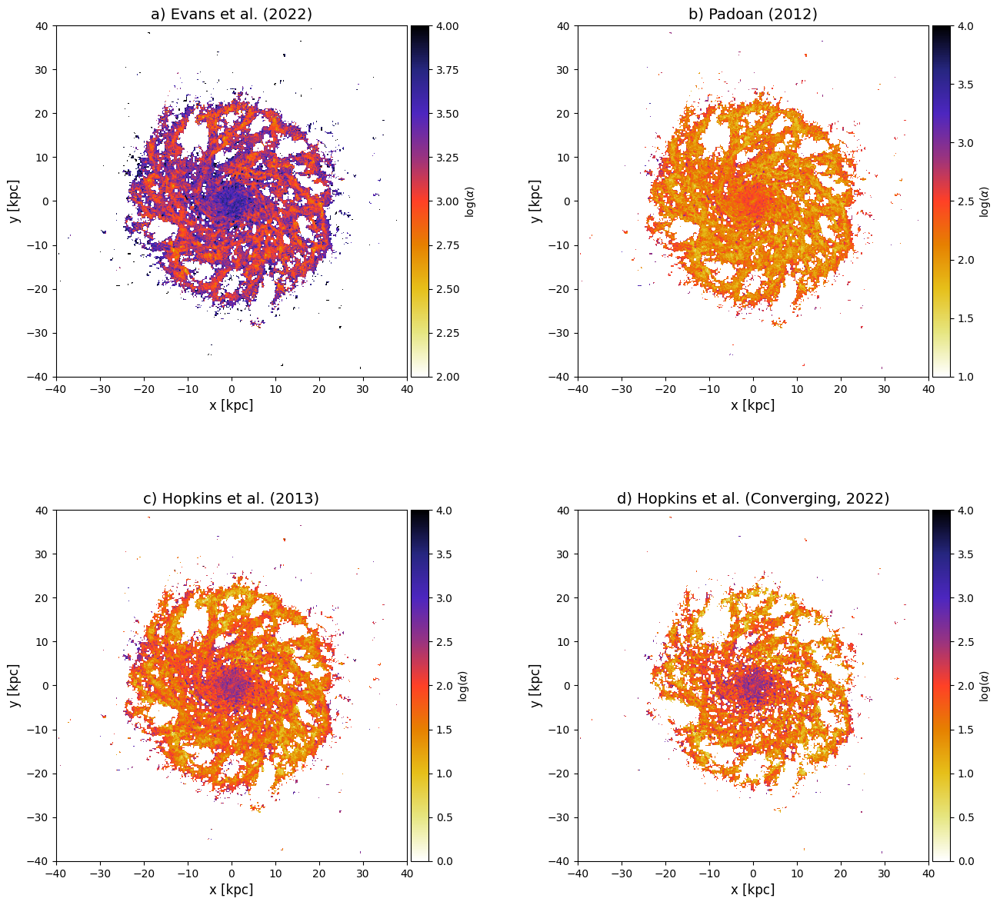

/tmp/ipykernel_1762/2131541961.py:35: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


In [43]:
title = ['a) Evans et al. (2022)', 'b) Padoan (2012)', 'c) Hopkins et al. (2013)', 'd) Hopkins et al. (Converging, 2022)']
alpha = [alpha_vir_W_50, alpha_Pad_W_50, alpha_Hop_W_50]
vmin_list = [2, 1, 0, 0]
vmax_list = [4, 4, 4, 4]
fig = plt.figure(figsize = (15, 15))
gs0 = gd.GridSpec(2,2, figure=fig, wspace = 0.4)

for n in range(3):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(np.log10(mw_hist(gal.g, alpha[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = r'log($\alpha$)')
    ax.set_title(title[n], wrap = True, fontsize = 14)
    ax.set_xlabel('x [kpc]', fontsize = 12)
    ax.set_ylabel('y [kpc]', fontsize = 12)
    ax.set_xlim(-40, 40)
    ax.set_ylim(-40, 40)
    ax.set_aspect(1./ax.get_data_ratio())

for n in range(1):
    ax = fig.add_subplot(gs0[3+n])
    im = ax.imshow(np.log10(mw_hist(gal_low_div, alpha_Hop_conv_W_50, 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[3+n], vmax = vmax_list[3+n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = r'log($\alpha$)')
    ax.set_title(title[3+n], wrap = True, fontsize = 14)
    ax.set_xlabel('x [kpc]', fontsize = 12)
    ax.set_ylabel('y [kpc]', fontsize = 12)
    ax.set_xlim(-40, 40)
    ax.set_ylim(-40, 40)
    ax.set_aspect(1./ax.get_data_ratio())

plt.show()
fig.tight_layout()
fig.savefig('../Documents/Bachelorthesis/alpha_low_comparison2_cold.png')

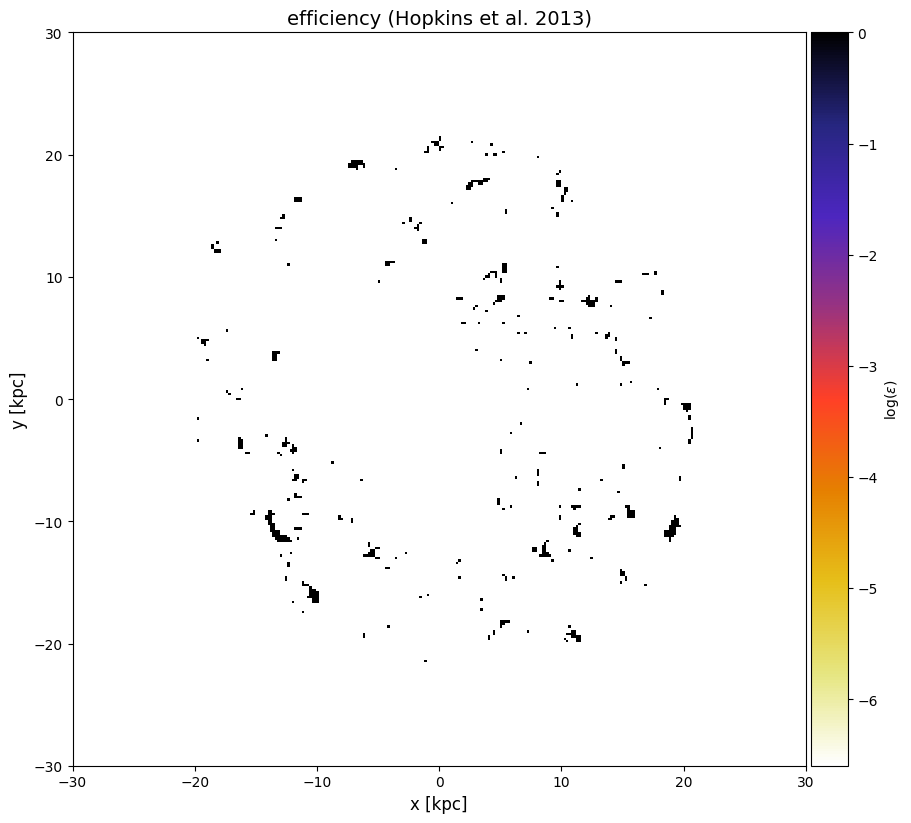

In [44]:
g_hist2, g_xedge2, g_yedge2, g_bin2  = stats.binned_statistic_2d(x_Hop_W_50, y_Hop_W_50, np.zeros(len(x_Hop_W_50)), statistic = 'mean', bins = 500, range=((-50,50),(-50,50)))
fig = plt.figure(figsize = (10, 10))
gs0 = gd.GridSpec(1,1, figure=fig, wspace = 0.3)

for n in range(1):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(g_hist2, extent=(-50,50,-50,50), cmap='CMRmap_r', vmin=0, vmax = -6)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = r'log($\epsilon$)')
    ax.set_title('efficiency (Hopkins et al. 2013)', fontsize = 14)
    ax.set_xlabel('x [kpc]', fontsize = 12)
    ax.set_ylabel('y [kpc]', fontsize = 12)
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())

plt.show()
fig.savefig('../Documents/Bachelorthesis/effhop_cold.png')

/tmp/ipykernel_1762/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass


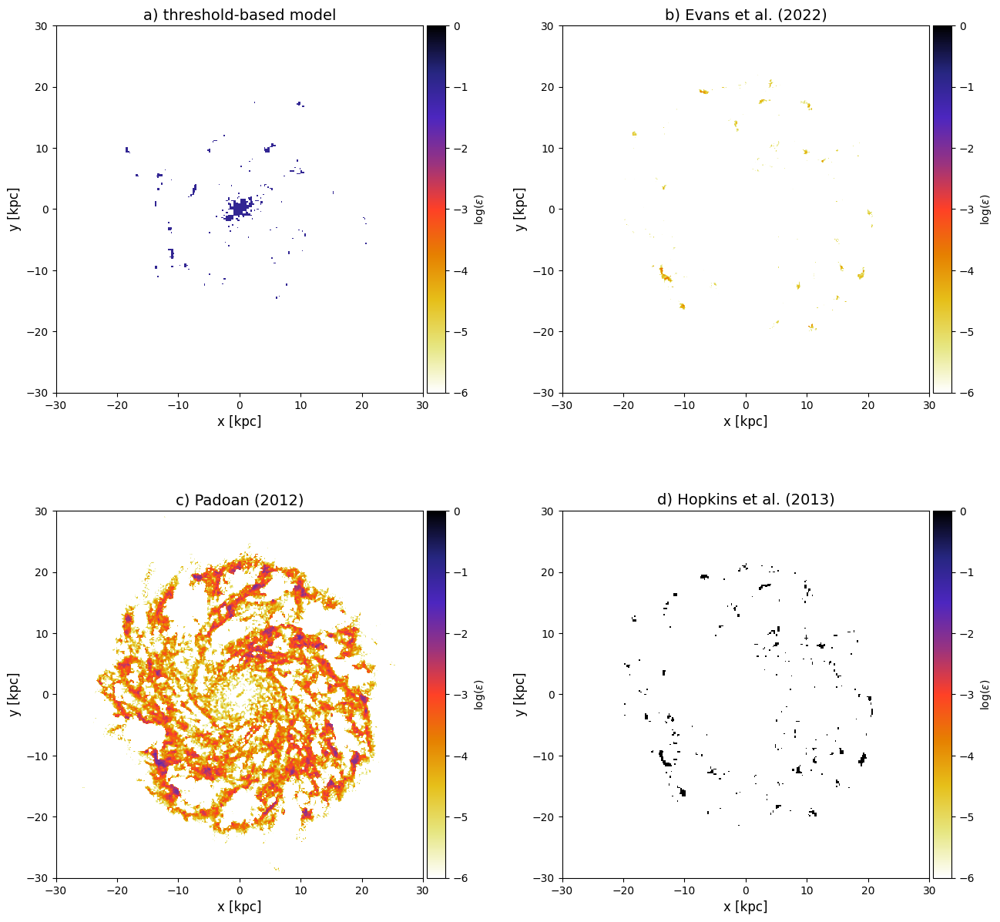

In [45]:
g_hist, g_xedge, g_yedge, g_bin  = stats.binned_statistic_2d(x_sf_W_50, y_sf_W_50, -1*np.ones(len(x_sf_W_50)), statistic = 'mean', bins = 500, range=((-50,50),(-50,50)))
g_hist2, g_xedge2, g_yedge2, g_bin2  = stats.binned_statistic_2d(x_Hop_W_50, y_Hop_W_50, np.zeros(len(x_Hop_W_50)), statistic = 'mean', bins = 500, range=((-50,50),(-50,50)))
title = ['a) threshold-based model', 'b) Evans et al. (2022)', 'c) Padoan (2012)', 'd) Hopkins et al. (2013)']
eff = [g_hist, np.log10(mw_hist(gal.g, eff_evans_1_W_50, 500)), np.log10(mw_hist(gal.g, eff_pad_W_50, 500)), g_hist2]
cmap = ['CMRmap_r', 'CMRmap_r', 'CMRmap_r', 'CMRmap_r']
vmin_list = [-6, -6, -6, -6]
vmax_list = [0, 0, 0, 0]
label = [r'log($\epsilon$)', r'log($\epsilon$)', r'log($\epsilon$)', r'log($\epsilon$)']
fig = plt.figure(figsize = (15, 15))
gs0 = gd.GridSpec(2,2, figure=fig, wspace = 0.3)

for n in range(4):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(eff[n], extent=(-50,50,-50,50), cmap=cmap[n], vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = label[n])
    ax.set_title(title[n], fontsize = 14)
    ax.set_xlabel('x [kpc]', fontsize = 12)
    ax.set_ylabel('y [kpc]', fontsize = 12)
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())

plt.show()
fig.savefig('../Documents/Bachelorthesis/effcompar_cold.png')

/tmp/ipykernel_1762/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass


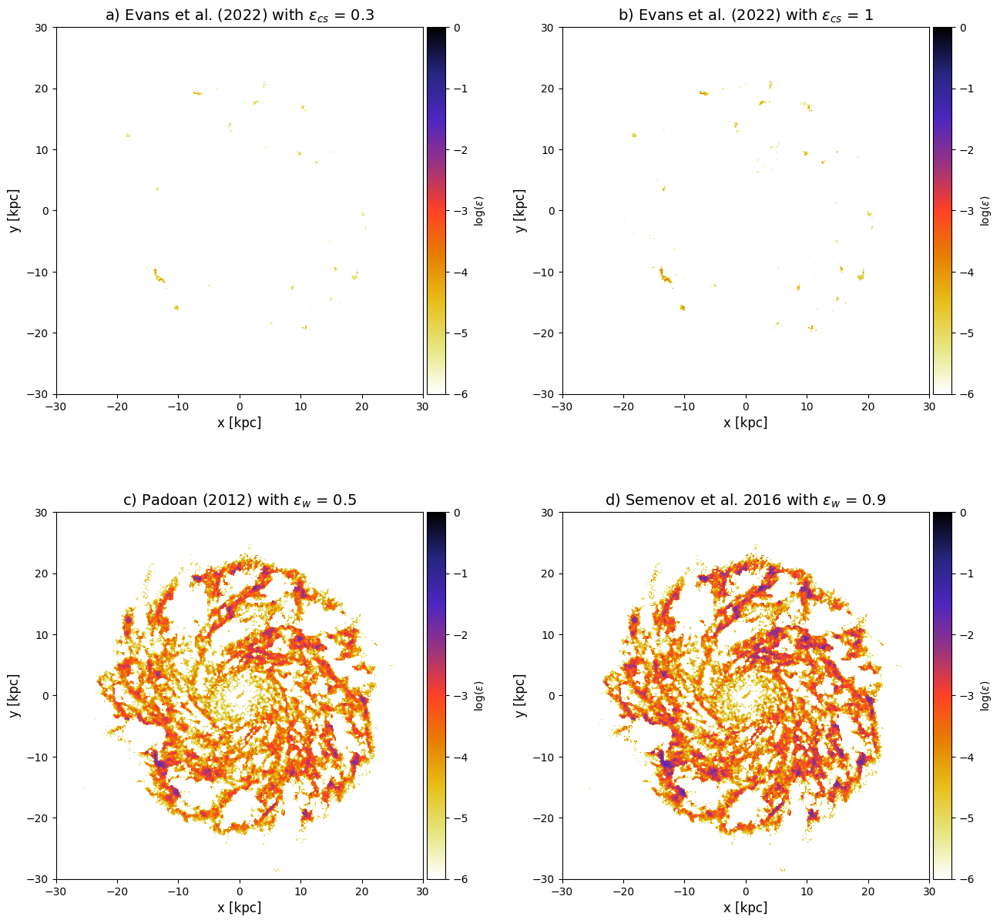

In [46]:
title = [r'a) Evans et al. (2022) with $\epsilon_{cs}$ = 0.3', r'b) Evans et al. (2022) with $\epsilon_{cs}$ = 1', r'c) Padoan (2012) with $\epsilon_{w}$ = 0.5', r'd) Semenov et al. 2016 with $\epsilon_{w}$ = 0.9']
eff = [np.log10(mw_hist(gal.g, eff_evans_0_3_W_50, 500)), np.log10(mw_hist(gal.g, eff_evans_1_W_50, 500)), np.log10(mw_hist(gal.g, eff_pad_W_50, 500)), np.log10(mw_hist(gal.g, eff_sem_W_50, 500))]
cmap = ['CMRmap_r', 'CMRmap_r', 'CMRmap_r', 'CMRmap_r']
vmin_list = [-6, -6, -6, -6]
vmax_list = [0, 0, 0, 0]
label = [r'log($\epsilon$)', r'log($\epsilon$)', r'log($\epsilon$)', r'log($\epsilon$)']
fig = plt.figure(figsize = (15, 15))
gs0 = gd.GridSpec(2, 2, figure=fig, wspace = 0.3)

for n in range(4):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(eff[n], extent=(-50,50,-50,50), cmap=cmap[n], vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = label[n])
    ax.set_title(title[n], fontsize = 14)
    ax.set_xlabel('x [kpc]', fontsize = 12)
    ax.set_ylabel('y [kpc]', fontsize = 12)
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())

plt.show()
fig.savefig('../Documents/Bachelorthesis/evans_com_cold.png')

/tmp/ipykernel_291/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass
/tmp/ipykernel_291/3870777613.py:2: RuntimeWarning: divide by zero encountered in log10
  eff = [np.log10(mw_hist(gal.g, eff_pad_W_50, 500)), np.log10(mw_hist(gal.g, eff_sem_W_50, 500))]


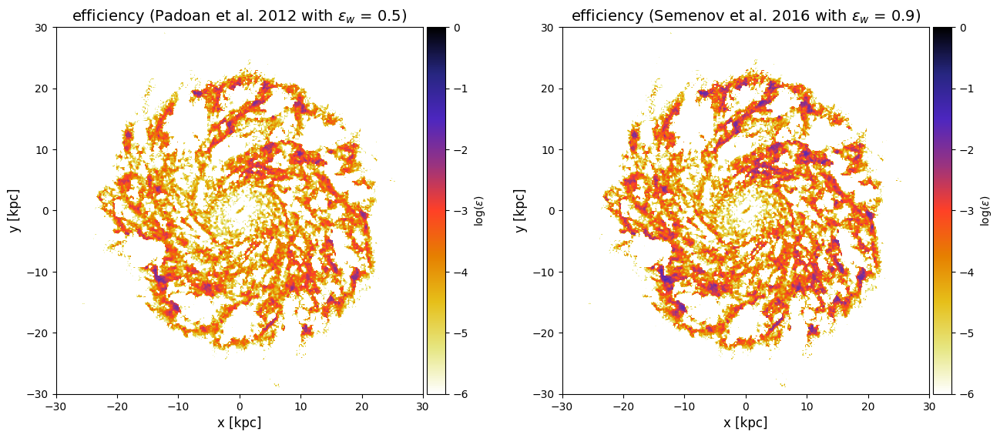

In [69]:
title = [r'(Padoan et al. 2012 with $\epsilon_{w}$ = 0.5)', r'(Semenov et al. 2016 with $\epsilon_{w}$ = 0.9)']
eff = [np.log10(mw_hist(gal.g, eff_pad_W_50, 500)), np.log10(mw_hist(gal.g, eff_sem_W_50, 500))]
cmap = ['CMRmap_r', 'CMRmap_r']
vmin_list = [-6, -6]
vmax_list = [0, 0]
label = [r'log($\epsilon$)', r'log($\epsilon$)']
fig = plt.figure(figsize = (15, 15))
gs0 = gd.GridSpec(1,2, figure=fig, wspace = 0.3)

for n in range(2):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(eff[n], extent=(-50,50,-50,50), cmap=cmap[n], vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = label[n])
    ax.set_title('efficiency ' + title[n], fontsize = 14)
    ax.set_xlabel('x [kpc]', fontsize = 12)
    ax.set_ylabel('y [kpc]', fontsize = 12)
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())

plt.show()
fig.savefig('../Documents/Bachelorthesis/sempad_com.png')

/tmp/ipykernel_350/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass
/tmp/ipykernel_350/2434090391.py:22: RuntimeWarning: divide by zero encountered in log10
  im2 = ax2.imshow(np.log10(mw_hist(gal.g, eff_vir_W_50, 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = -6, vmax = -1)
/tmp/ipykernel_350/2434090391.py:31: RuntimeWarning: divide by zero encountered in log10
  im3 = ax3.imshow(np.log10(mw_hist(gal.g, eff_Pad_W_50, 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = -6, vmax = -1)
/tmp/ipykernel_350/2434090391.py:40: RuntimeWarning: divide by zero encountered in log10
  im4 = ax4.imshow(np.log10(mw_hist(gal.g, eff_Hop_W_50, 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = -6, vmax = -1)


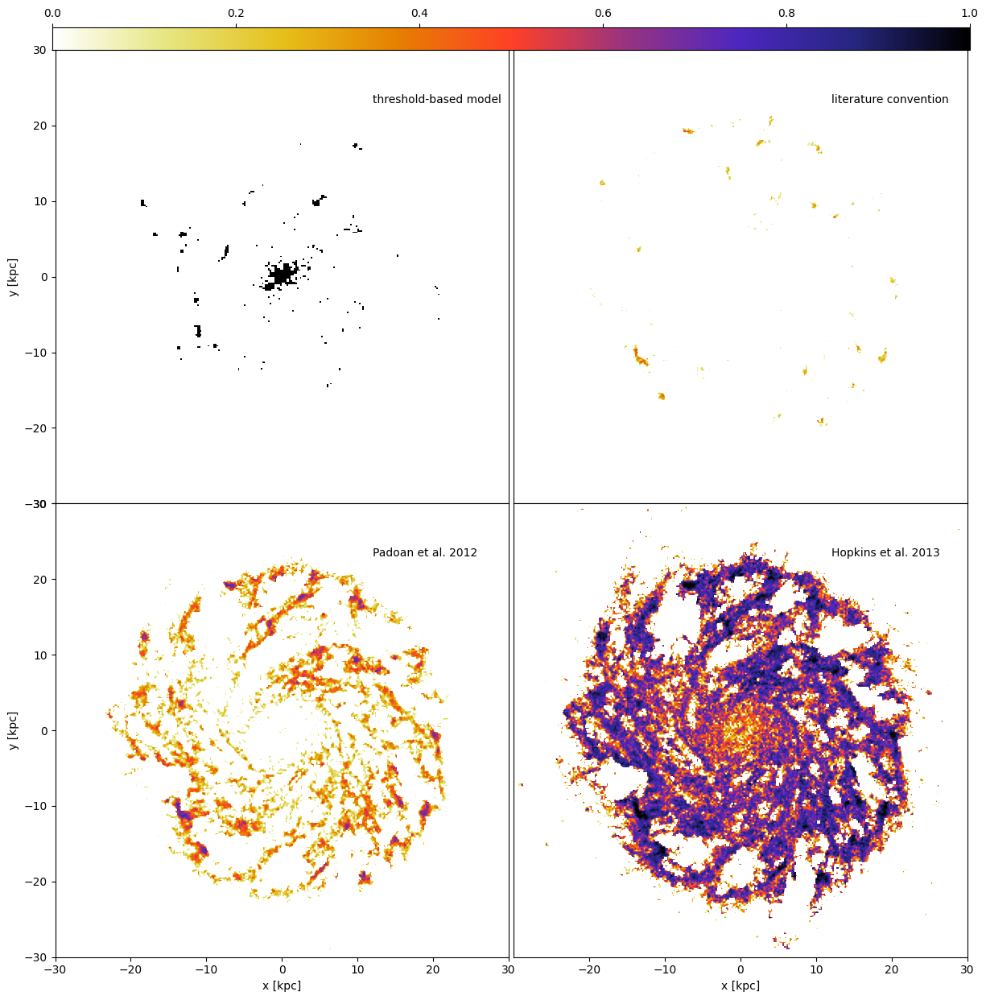

In [77]:
g_hist, g_xedge, g_yedge, g_bin  = stats.binned_statistic_2d(gal_sf['x'], gal_sf['y'], -1*np.ones(len(gal_sf['x'])), bins = 500, range=((-50,50),(-50,50)))
title = ['(threshold-based model)', '(literature convention)', '(Padoan et al. 2012)', '(Hopkins et al. 2013)', 'Hopkins et al. (Converging, 2022)']

fig = plt.figure(figsize = (14.7, 15))
gs0 = gd.GridSpec(3, 2, figure=fig, width_ratios=[1,1], height_ratios=[0.05, 1,1], hspace = 0, wspace = 0)

ax = plt.subplot(gs0[0, :])
cb1 = colorbar.ColorbarBase(ax, orientation = 'horizontal', cmap="CMRmap_r")
cb1.ax.xaxis.set_ticks_position('top')
cb1.ax.xaxis.set_label_position('top')

ax1 = fig.add_subplot(gs0[2])
im1 = ax1.imshow(g_hist, extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = -6, vmax = -1)
ax1.set_xlim(-30, 30)
ax1.set_ylim(-30, 30)
ax1.set_ylabel('y [kpc]')
ax1.get_xaxis().set_visible(False)
ax1.text(12, 23, 'threshold-based model')
ax1.set_aspect(1./ax1.get_data_ratio())

ax2 = fig.add_subplot(gs0[3], sharey = ax1)
im2 = ax2.imshow(np.log10(mw_hist(gal.g, eff_vir_W_50, 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = -6, vmax = -1)
ax2.set_xlim(-30, 30)
ax2.set_ylim(-30, 30)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)
ax2.text(12, 23, 'literature convention')
ax2.set_aspect(1./ax2.get_data_ratio())

ax3 = fig.add_subplot(gs0[4], sharex = ax1)
im3 = ax3.imshow(np.log10(mw_hist(gal.g, eff_Pad_W_50, 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = -6, vmax = -1)
ax3.set_xlim(-30, 30)
ax3.set_ylim(-30, 30)
ax3.set_xlabel('x [kpc]')
ax3.set_ylabel('y [kpc]')
ax3.text(12, 23, 'Padoan et al. 2012')
ax3.set_aspect(1./ax3.get_data_ratio())

ax4 = fig.add_subplot(gs0[5], sharey = ax3, sharex = ax2)
im4 = ax4.imshow(np.log10(mw_hist(gal.g, eff_Hop_W_50, 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = -6, vmax = -1)
ax4.set_xlim(-29.9999999, 30)
ax4.set_ylim(-30, 30)
ax4.set_xlabel('x [kpc]')
ax4.get_yaxis().set_visible(False)
ax4.text(12, 23, 'Hopkins et al. 2013')
ax4.set_aspect(1./ax4.get_data_ratio())


#fig.colorbar(im4, orientation='vertical', label = r'log($\epsilon$)')

plt.show()
fig.savefig('../Documents/Bachelorthesis/effcomparisonn2.png')

/tmp/ipykernel_350/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass
/tmp/ipykernel_350/1163038499.py:10: RuntimeWarning: divide by zero encountered in log10
  im = ax.imshow(np.log10(mw_hist(gal.g, eff[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])


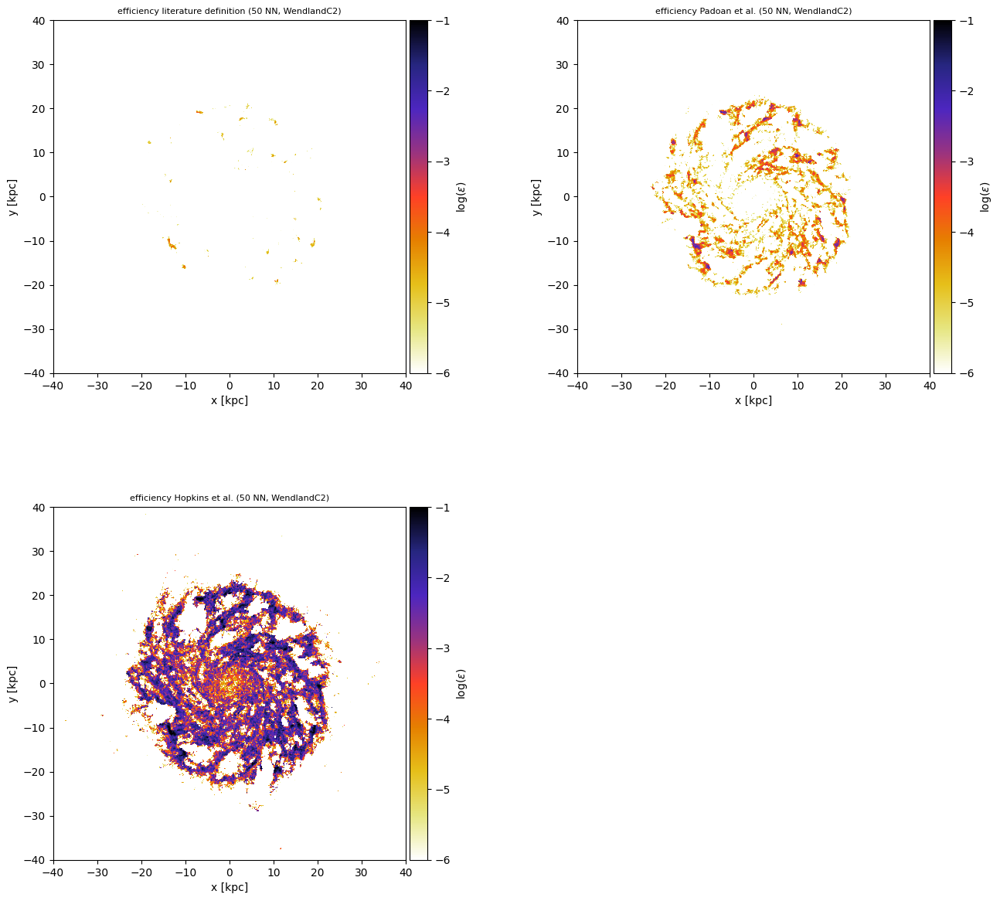

In [78]:
title = ['literature definition (50 NN, WendlandC2)', 'Padoan et al. (50 NN, WendlandC2)', 'Hopkins et al. (50 NN, WendlandC2)']
eff = [eff_vir_W_50, eff_Pad_W_50, eff_Hop_W_50]
vmin_list = [-6, -6, -6]
vmax_list = [-1, -1, -1]
fig = plt.figure(figsize = (15, 15))
gs0 = gd.GridSpec(2,2, figure=fig, wspace = 0.4)

for n in range(3):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(np.log10(mw_hist(gal.g, eff[n], 500)), extent=(-50,50,-50,50), cmap='CMRmap_r', vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = r'log($\epsilon$)')
    ax.set_title('efficiency ' + title[n], wrap = True, fontsize = 8)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim(-40, 40)
    ax.set_ylim(-40, 40)
    ax.set_aspect(1./ax.get_data_ratio())
    

plt.show()
fig.savefig('../Documents/Bachelorthesis/eff_comparison2.png')

In [47]:
title = ['gas density (50 NN, WendlandC2)', 'gas temperature (50 NN, WendlandC2)', 'velocity dispersion (50 NN, WendlandC2)', 'virial parameter, literature definition (50 NN, WendlandC2)', 'efficiency, literature definition (50 NN, WendlandC2)']
quantity = [np.log10(mw_hist(gal.g, rho_W_50, 500)), np.log10(mw_hist2(gal.g,'temp', 500)), mw_hist(gal.g, vdisp_W_50, 500), np.log10(mw_hist(gal.g, alpha_vir_W_50, 500)), np.log10(mw_hist(gal.g, eff_vir_W_50, 500))]
label_list = [r'log($\rho$) [M$_\odot$/kpc$^3$]', r'log(T) [K]', r'$\sigma$ [km/s]', r'log($\alpha$)', r'log($\epsilon$)']
color = ['Spectral_r', 'seismic', 'Spectral_r', 'coolwarm', 'Spectral_r']

fig = plt.figure(figsize = (20,12))
gs0 = gd.GridSpec(2, 3, figure=fig, wspace = 0.4)
vmin_list = [7, 1, 30, 2, -12]
vmax_list = [9, 7, 130, 5, -3]

for n in range(5):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(quantity[n], extent=(-50,50,-50,50), cmap = color[n], vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = label_list[n])
    ax.set_title(title[n], wrap = True, fontsize = 10)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())

plt.show()


/tmp/ipykernel_1762/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass
/tmp/ipykernel_1762/17126251.py:25: RuntimeWarning: invalid value encountered in divide
  return hist/mass


NameError: name 'eff_vir_W_50' is not defined

/tmp/ipykernel_1762/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass
/tmp/ipykernel_1762/17126251.py:25: RuntimeWarning: invalid value encountered in divide
  return hist/mass


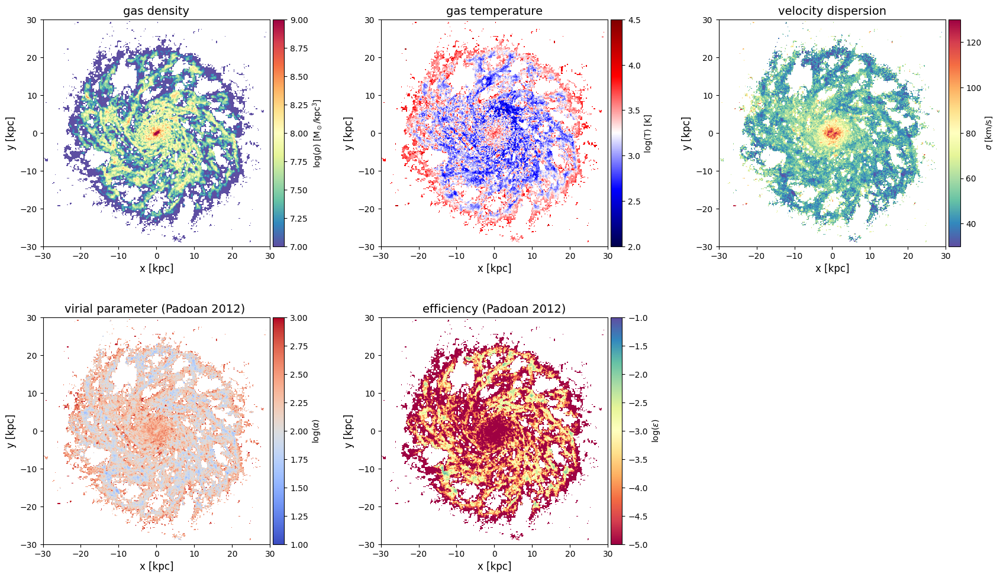

: 

In [61]:
title = ['gas density', 'gas temperature', 'velocity dispersion', 'virial parameter (Padoan 2012) ', 'efficiency (Padoan 2012)']
quantity = [np.log10(mw_hist(gal, rho_W_50, 500)), np.log10(mw_hist2(gal,'temp', 500)), mw_hist(gal, vdisp_W_50, 500), np.log10(mw_hist(gal, alpha_Pad_W_50, 500)), np.log10(mw_hist(gal, eff_pad_W_50, 500))]
label_list = [r'log($\rho$) [M$_\odot$/kpc$^3$]', r'log(T) [K]', r'$\sigma$ [km/s]', r'log($\alpha$)', r'log($\epsilon$)']
color = ['Spectral_r', 'seismic', 'Spectral_r', 'coolwarm', 'Spectral']

fig = plt.figure(figsize = (20,12))
gs0 = gd.GridSpec(2, 3, figure=fig, wspace = 0.4)
vmin_list = [7, 2, 30, 1, -5]
vmax_list = [9, 4.5, 130, 3, -1]

for n in range(5):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(quantity[n], extent=(-50,50,-50,50), cmap = color[n], vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = label_list[n])
    ax.set_title(title[n], wrap = True, fontsize = 14)
    ax.set_xlabel('x [kpc]', fontsize = 12)
    ax.set_ylabel('y [kpc]', fontsize = 12)
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())

plt.show()
fig.savefig('../Documents/Bachelorthesis/padoan_quantities_cold.png')

/tmp/ipykernel_350/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass
/tmp/ipykernel_350/17126251.py:25: RuntimeWarning: invalid value encountered in divide
  return hist/mass
/tmp/ipykernel_350/1760668578.py:2: RuntimeWarning: divide by zero encountered in log10
  quantity = [np.log10(mw_hist(gal.g, rho_W_50, 500)), np.log10(mw_hist2(gal.g,'temp', 500)), mw_hist(gal.g, vdisp_W_50, 500), np.log10(mw_hist(gal.g, alpha_Hop_W_50, 500)), np.log10(mw_hist(gal.g, eff_Hop_W_50, 500))]


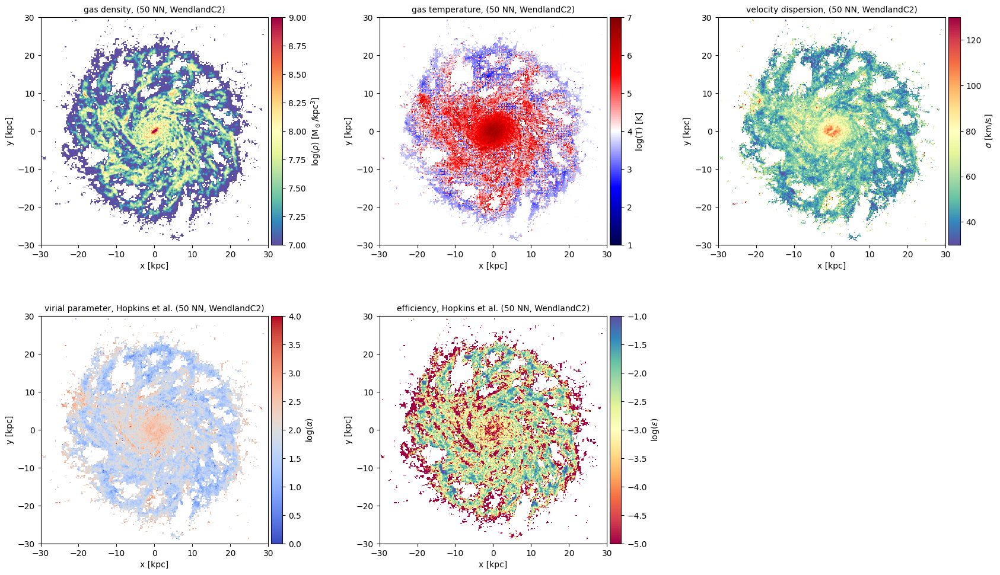

In [81]:
title = ['gas density', 'gas temperature', 'velocity dispersion', 'virial parameter, Hopkins et al.', 'efficiency, Hopkins et al.']
quantity = [np.log10(mw_hist(gal.g, rho_W_50, 500)), np.log10(mw_hist2(gal.g,'temp', 500)), mw_hist(gal.g, vdisp_W_50, 500), np.log10(mw_hist(gal.g, alpha_Hop_W_50, 500)), np.log10(mw_hist(gal.g, eff_Hop_W_50, 500))]
label_list = [r'log($\rho$) [M$_\odot$/kpc$^3$]', r'log(T) [K]', r'$\sigma$ [km/s]', r'log($\alpha$)', r'log($\epsilon$)']
color = ['Spectral_r', 'seismic', 'Spectral_r', 'coolwarm', 'Spectral']

fig = plt.figure(figsize = (20,12))
gs0 = gd.GridSpec(2, 3, figure=fig, wspace = 0.4)
vmin_list = [7, 1, 30, 0, -5]
vmax_list = [9, 7, 130, 4, -1]

for n in range(5):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(quantity[n], extent=(-50,50,-50,50), cmap = color[n], vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = label_list[n])
    ax.set_title(title[n], wrap = True, fontsize = 10)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())

plt.show()

In [82]:
title = ['gas density (50 NN, WendlandC2)', 'gas temperature (50 NN, WendlandC2)', 'velocity dispersion (50 NN, WendlandC2)', 'virial parameter, Padoan et al. (50 NN, WendlandC2)', 'efficiency, Padoan et al. (50 NN, WendlandC2)']
quantity = [np.log10(mw_hist2(gal.g[low_alpha], 'rho_W', 500)), np.log10(mw_hist2(gal.g[low_alpha],'temp', 500)), mw_hist2(gal.g[low_alpha], 'v_disp', 500), np.log10(mw_hist2(gal.g[low_alpha], 'alpha_sem', 500)), np.log10(mw_hist2(gal.g[low_alpha], 'efficiency_sem', 500))]
label_list = [r'log($\rho$) [M$_\odot$/kpc$^3$]', r'log(T) [K]', r'$\sigma$ [km/s]', r'log($\alpha$)', r'log($\epsilon$)']
color = ['Spectral_r', 'seismic', 'Spectral_r', 'coolwarm', 'Spectral']

fig = plt.figure(figsize = (20,12))
gs0 = gd.GridSpec(2, 3, figure=fig, wspace = 0.4)
vmin_list = [7, 1, 10, 1, -5]
vmax_list = [8.5, 4, 50, 2, -2]

for n in range(5):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(quantity[n], extent=(-50,50,-50,50), cmap = color[n], vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = label_list[n])
    ax.set_title(title[n], wrap = True, fontsize = 10)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim(-30, 30)
    ax.set_ylim(-30, 30)
    ax.set_aspect(1./ax.get_data_ratio())

plt.show()

NameError: name 'low_alpha' is not defined

In [ ]:
#dehnen paper for different nn
# t rho diagramm

In [ ]:
title = [r'Virial parameter Semenov ($\alpha < 100$), WendlandC2, 50 NN', r'Efficiency Semenov ($\alpha < 100$), WendlandC2, 50 NN']
key = [alpha_Pad_low_W_50, eff_Pad_low_W_50]
label = [r'log($\alpha$)', r'log($\epsilon$)']
colour = ['coolwarm', 'Spectral_r']
vmin_list = [0, -4]
vmax_list = [2, 0]
fig = plt.figure(figsize = (10, 15))
gs0 = gd.GridSpec(1,2, figure=fig, wspace = 0.4)

for n in range(2):
    ax = fig.add_subplot(gs0[n])
    im = ax.imshow(np.log10(mw_hist(gal_low_alpha_sem, key[n], 500)), extent=(-50,50,-50,50), cmap=colour[n], vmin = vmin_list[n], vmax = vmax_list[n])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label = label[n])
    ax.set_title(title[n], wrap = True, fontsize = 8)
    ax.set_xlabel('x [kpc]')
    ax.set_ylabel('y [kpc]')
    ax.set_xlim(-40, 40)
    ax.set_ylim(-40, 40)
    ax.set_aspect(1./ax.get_data_ratio())
    
plt.show()

/tmp/ipykernel_11633/122655273.py:2: RuntimeWarning: divide by zero encountered in log10
  im1 = plt.imshow(np.log10(eff_med_hist), cmap='Spectral_r', extent=(-50,50,-50,50), vmin = -4, vmax = 0)


(-30.0, 30.0)

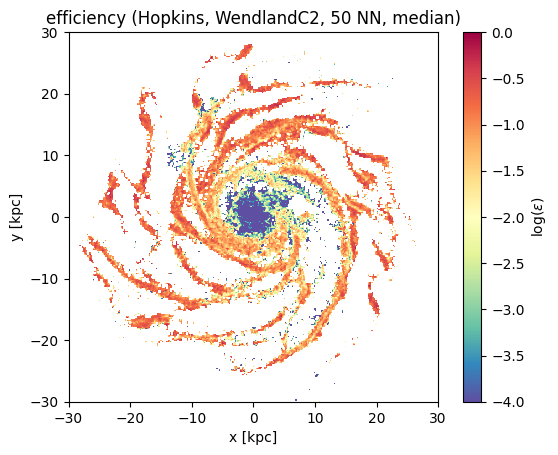

In [ ]:
eff_med_hist, g_xedge, g_yedge, g_bin  = stats.binned_statistic_2d(gal.g['x'],gal.g['y'], eff_Hop_W_50, statistic = 'median', bins = 500, range=((-50,50),(-50,50)))
im1 = plt.imshow(np.log10(eff_med_hist), cmap='Spectral_r', extent=(-50,50,-50,50), vmin = -4, vmax = 0)
plt.colorbar(im1, orientation='vertical', label = r'log($\epsilon$)')
plt.title('efficiency (Hopkins, WendlandC2, 50 NN, median)')
plt.xlabel('x [kpc]')
plt.ylabel('y [kpc]')
plt.xlim(-30, 30)
plt.ylim(-30, 30)

In [34]:
# high resolution
G = 6.68e-11*units.m**3*units.kg**(-1)*units.s**(-2)
t_ff = np.sqrt(3*np.pi/(32*G*rho_W_50.in_units('m^-3 kg^1')))
t_ff_sf = np.sqrt(3*np.pi/(32*G*gal_sf.g['rho'].in_units('m^-3 kg^1')))
t_ff_Hop = np.sqrt(3*np.pi/(32*G*gal_Hop.g['rho'].in_units('m^-3 kg^1')))
sfr_Hop = 1 * gal_Hop['mass']/t_ff_Hop.in_units('yr')
sfr_Sem = eff_sem_W_50 * mass_W_50/t_ff.in_units('yr')
sfr_Pad = eff_pad_W_50 * mass_W_50/t_ff.in_units('yr')
sfr_Evans = eff_evans_1_W_50 * mass_W_50/t_ff.in_units('yr')
sfr_sf = gal_sf['mass']*0.01/t_ff_sf.in_units('yr')

In [121]:
# low resolution
G = 6.68e-11*units.m**3*units.kg**(-1)*units.s**(-2)
t_ff_2 = np.sqrt(3*np.pi/(32*G*rho_W_50_2.in_units('m^-3 kg^1')))
t_ff_sf_2 = np.sqrt(3*np.pi/(32*G*gal2_sf.g['rho'].in_units('m^-3 kg^1')))
t_ff_Hop_2 = np.sqrt(3*np.pi/(32*G*gal2_Hop.g['rho'].in_units('m^-3 kg^1')))
sfr_Hop = 1 * gal2_Hop['mass']/t_ff_Hop_2.in_units('yr')
sfr_Sem = eff_sem_W_50_2 * mass_W_50_2/t_ff_2.in_units('yr')
sfr_Pad = eff_pad_W_50_2 * mass_W_50_2/t_ff_2.in_units('yr')
sfr_Evans = eff_evans_1_W_50_2 * mass_W_50_2/t_ff_2.in_units('yr')
sfr_sf = gal2_sf['mass']*0.1/t_ff_sf_2.in_units('yr')

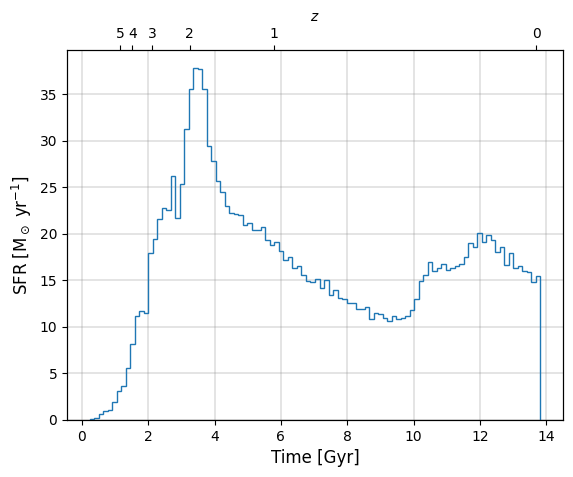

In [55]:
pynbody.plot.stars.sfh(gal)
plt.grid(linewidth = 0.3, color = 'grey')
plt.savefig('../Documents/Bachelorthesis/SFH.png')


/tmp/ipykernel_5653/17126251.py:30: RuntimeWarning: invalid value encountered in divide
  return hist/mass
/tmp/ipykernel_5653/2126476122.py:2: RuntimeWarning: divide by zero encountered in log10
  im1 = plt.imshow(np.log10(mw_hist(gal.g, sfr_Pad, 400)), cmap='Spectral_r', extent=(-50,50,-50,50), vmin = -10, vmax = 0)


(-30.0, 30.0)

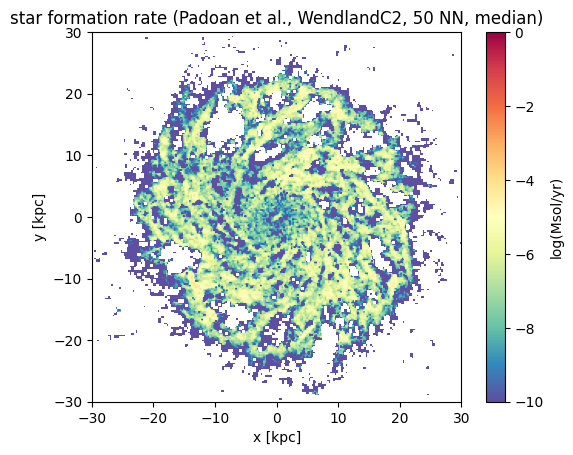

In [50]:
#sf_rate_hist, g_xedge, g_yedge, g_bin  = stats.binned_statistic_2d(gal.g['x'],gal.g['y'], sf_rate, statistic = 'mean', bins = 500, range=((-50,50),(-50,50)))
im1 = plt.imshow(np.log10(mw_hist(gal.g, sfr_Pad, 400)), cmap='Spectral_r', extent=(-50,50,-50,50), vmin = -10, vmax = 0)
plt.colorbar(im1, orientation='vertical', label = 'log(Msol/yr)')
plt.title('star formation rate (Padoan et al., WendlandC2, 50 NN, median)')
plt.xlabel('x [kpc]')
plt.ylabel('y [kpc]')
plt.xlim(-30, 30)
plt.ylim(-30, 30)

In [35]:
np.sum(sfr_Pad)

SimArray(1.09836412)

In [36]:
np.sum(sfr_Evans)

SimArray(0.00212019)

In [37]:
np.sum(sfr_Sem)

SimArray(1.97705541)

In [38]:
np.sum(sfr_Hop)

SimArray(27.87492156, 'Msol yr**-1')

In [39]:
np.sum(sfr_sf)

SimArray(1.01183726, 'Msol yr**-1')

/tmp/ipykernel_4901/2808841155.py:4: RuntimeWarning: divide by zero encountered in log10
  plt.hist(np.log10(sfr_Evans), bins = 300, density = True, histtype = 'step', range = (-7, -1), label = 'Evans et al. 2022')
/tmp/ipykernel_4901/2808841155.py:5: RuntimeWarning: divide by zero encountered in log10
  plt.hist(np.log10(sfr_Sem), bins = 300, density = True, histtype = 'step', range = (-7, -1), label = 'Semenov et al. 2016')
/tmp/ipykernel_4901/2808841155.py:6: RuntimeWarning: divide by zero encountered in log10
  plt.hist(np.log10(sfr_Pad), bins = 300, density = True, histtype = 'step', range = (-7, -1), label = 'Padoan et al. 2012')


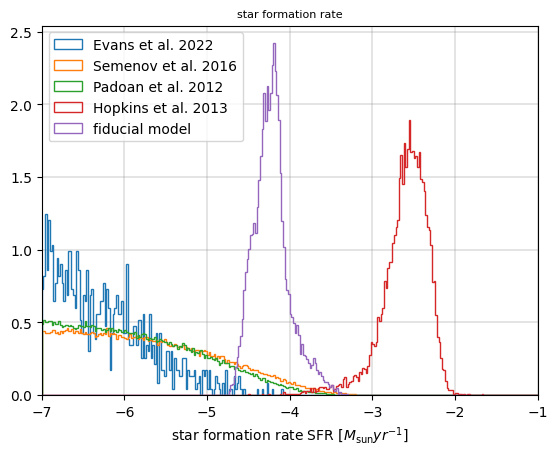

In [74]:
#histogram star formation rate

plt.figure()
plt.hist(np.log10(sfr_Evans), bins = 300, density = True, histtype = 'step', range = (-7, -1), label = 'Evans et al. 2022')
plt.hist(np.log10(sfr_Sem), bins = 300, density = True, histtype = 'step', range = (-7, -1), label = 'Semenov et al. 2016')
plt.hist(np.log10(sfr_Pad), bins = 300, density = True, histtype = 'step', range = (-7, -1), label = 'Padoan et al. 2012')
plt.hist(np.log10(sfr_Hop), bins = 300, density = True, histtype = 'step', range = (-7, -1), label = 'Hopkins et al. 2013')
plt.hist(np.log10(sfr_sf), bins = 300, density = True, histtype = 'step', range = (-7, -1), label = 'fiducial model')
plt.title('star formation rate', wrap = True, fontsize = 8)
plt.xlabel(r'star formation rate SFR [$M_{\mathrm{sun}} yr^{-1}$]')
plt.grid(linewidth = 0.3, color = 'grey')
plt.xlim(-7, -1)
plt.legend(loc = 'upper left')
plt.savefig('../Documents/Bachelorthesis/SFR_comparison.png')

In [ ]:
def binstat(fam, key, b):
    stat, edges, num = stats.binned_statistic(fam['r'], fam[key]*fam['mass'], statistic = sum, bins = b)
    stat_mass, edges_mass, num_mass = stats.binned_statistic(fam['r'], fam['mass'], statistic = sum, bins = b)
    return stat/stat_mass, edges[:-1]

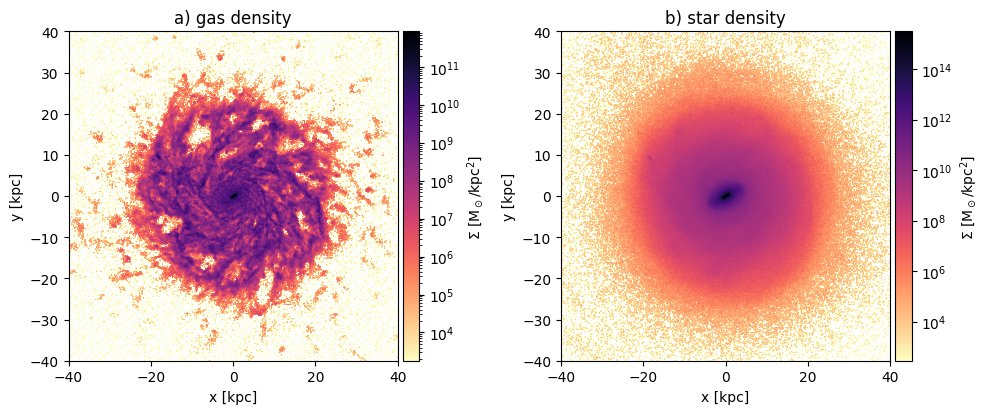

In [40]:
# densities
g_hist, g_xbins, g_ybins = np.histogram2d(gal.g['x'],gal.g['y'],weights=gal.g['rho'], bins=500, range=((-50,50),(-50,50)))
s_hist, s_xbins, s_ybins = np.histogram2d(gal.s['x'],gal.s['y'],weights=gal.s['rho'], bins=500, range=((-50,50),(-50,50)))

fig = plt.figure(figsize = (10,10))

ax1 = plt.subplot(121)
im1 = ax1.imshow(g_hist, cmap='magma_r', extent=(-50,50,-50,50), norm = colors.LogNorm())
ax1.imshow(g_hist, cmap='magma_r', extent=(-50,50,-50,50), norm = colors.LogNorm())
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='vertical', label = '$\Sigma$ [M$_\odot$/kpc$^2$]')
ax1.set_title('a) gas density')
ax1.set_xlabel('x [kpc]')
ax1.set_ylabel('y [kpc]')
ax1.set_xlim(-40, 40)
ax1.set_ylim(-40,40)

ax2 = plt.subplot(122)
im2 = ax2.imshow(s_hist, cmap='magma_r', extent=(-50,50,-50,50), norm = colors.LogNorm())
ax2.imshow(s_hist, cmap='magma_r', extent=(-50,50,-50,50), norm = colors.LogNorm())
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical', label = '$\Sigma$ [M$_\odot$/kpc$^2$]')
ax2.set_title('b) star density')
ax2.set_xlabel('x [kpc]')
ax2.set_ylabel('y [kpc]')
ax2.set_xlim(-40, 40)
ax2.set_ylim(-40,40)

fig.tight_layout()
plt.show()
fig.savefig('../Documents/Bachelorthesis/density_plots_report.png')

/tmp/ipykernel_283/17126251.py:25: RuntimeWarning: invalid value encountered in divide
  return hist/mass


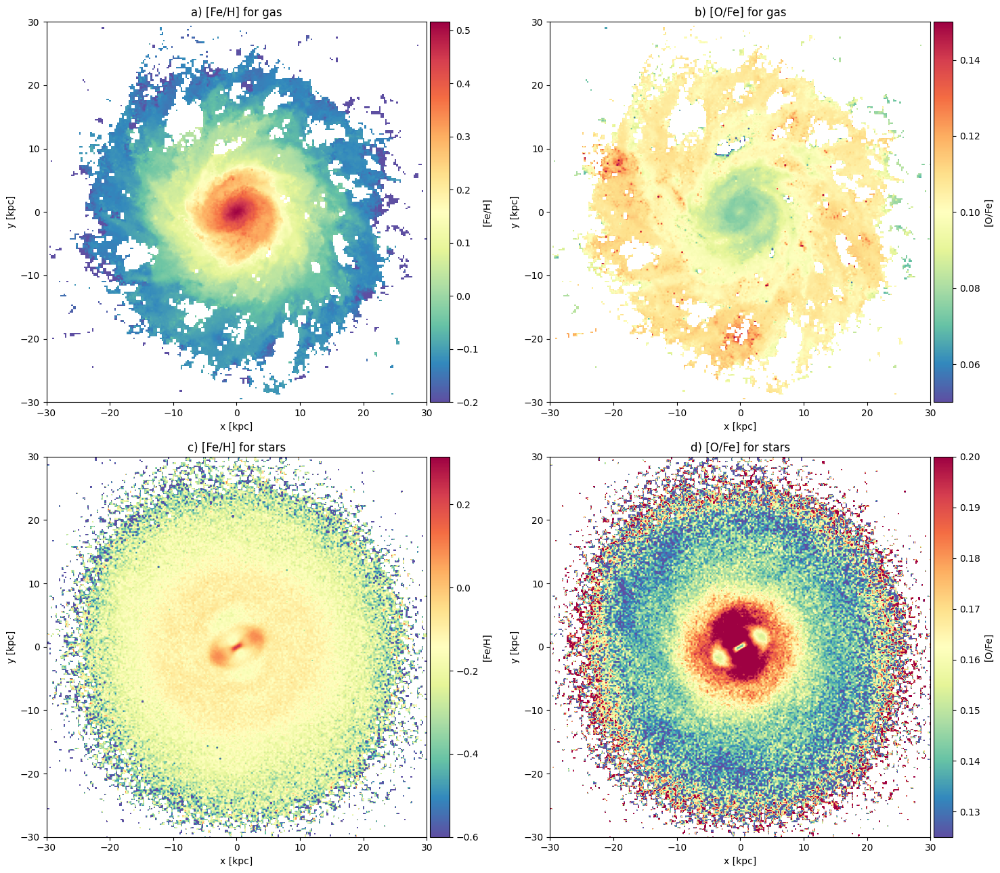

In [25]:
# [Fe/H] and [O/Fe]
fig = plt.figure(figsize = (15,13))

ax1 = plt.subplot(221)
im1 = ax1.imshow(mw_hist2(gal.g,'feh',400), cmap='Spectral_r', extent=(-50,50,-50,50), vmin = -0.2)
ax1.imshow(mw_hist2(gal.g,'feh',400), cmap='Spectral_r', extent=(-50,50,-50,50), vmin =-0.2)
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='vertical', label = '[Fe/H]')
ax1.set_title('a) [Fe/H] for gas')
ax1.set_xlabel('x [kpc]')
ax1.set_ylabel('y [kpc]')
ax1.set_aspect('equal')
ax1.set_xlim(-30,30)
ax1.set_ylim(-30,30)

ax2 = plt.subplot(222)
im2 = ax2.imshow(mw_hist2(gal.g,'ofe',400), cmap='Spectral_r', extent=(-50,50,-50,50), vmin = 0.05, vmax = 0.15)
ax2.imshow(mw_hist2(gal.g,'ofe',400), cmap='Spectral_r', extent=(-50,50,-50,50), vmin = 0.05, vmax = 0.15)
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical', label = '[O/Fe]')
ax2.set_title('b) [O/Fe] for gas')
ax2.set_xlabel('x [kpc]')
ax2.set_ylabel('y [kpc]')
ax2.set_aspect('equal')
ax2.set_xlim(-30,30)
ax2.set_ylim(-30,30)

ax3 = plt.subplot(223)
im3 = ax3.imshow(mw_hist2(gal.s,'feh',400), cmap='Spectral_r', extent=(-50,50,-50,50), vmin = -0.6)
ax3.imshow(mw_hist2(gal.s,'feh',400), cmap='Spectral_r', extent=(-50,50,-50,50), vmin = -0.6)
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im3, cax=cax, orientation='vertical', label = '[Fe/H]')
ax3.set_title('c) [Fe/H] for stars')
ax3.set_xlabel('x [kpc]')
ax3.set_ylabel('y [kpc]')
ax3.set_aspect('equal')
ax3.set_xlim(-30,30)
ax3.set_ylim(-30,30)

ax4 = plt.subplot(224)
im4 = ax4.imshow(mw_hist2(gal.s,'ofe',400), extent=(-50,50,-50,50), cmap='Spectral_r', vmin = 0.125, vmax = 0.2)
ax4.imshow(mw_hist2(gal.s,'ofe',400), extent=(-50,50,-50,50), cmap='Spectral_r', vmin =0.125, vmax = 0.2)
divider = make_axes_locatable(ax4)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im4, cax=cax, orientation='vertical', label = '[O/Fe]')
ax4.set_title('d) [O/Fe] for stars')
ax4.set_xlabel('x [kpc]')
ax4.set_ylabel('y [kpc]')
ax4.set_aspect('equal')
ax4.set_xlim(-30,30)
ax4.set_ylim(-30,30)

fig.tight_layout()
plt.show()
fig.savefig('../Documents/Bachelorthesis/metallicity_plots_report.png')

/tmp/ipykernel_283/17126251.py:25: RuntimeWarning: invalid value encountered in divide
  return hist/mass


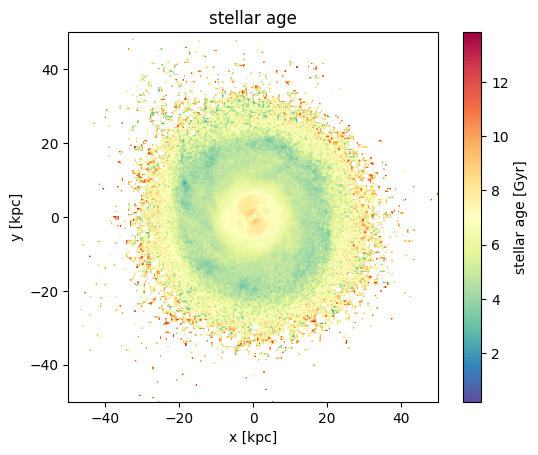

In [77]:
# age of stars
plt.imshow(mw_hist2(gal.s,'age',200), cmap = 'Spectral_r', extent=(-50,50,-50,50))
plt.colorbar(label = 'stellar age [Gyr]')
plt.title('stellar age')
plt.xlabel('x [kpc]')
plt.ylabel('y [kpc]')
plt.savefig('../Documents/Bachelorthesis/stellar_age_plot_repor.png')

In [28]:
# mass weighted 1d histograms

def mwhist(prof,key):
    mwhist, xbin  = np.histogram(prof['rbins'],weights=prof[key]*prof['mass'])
    mwmass, massbin = np.histogram(prof['rbins'],weights=prof['mass'])
    return mwhist/mwmass

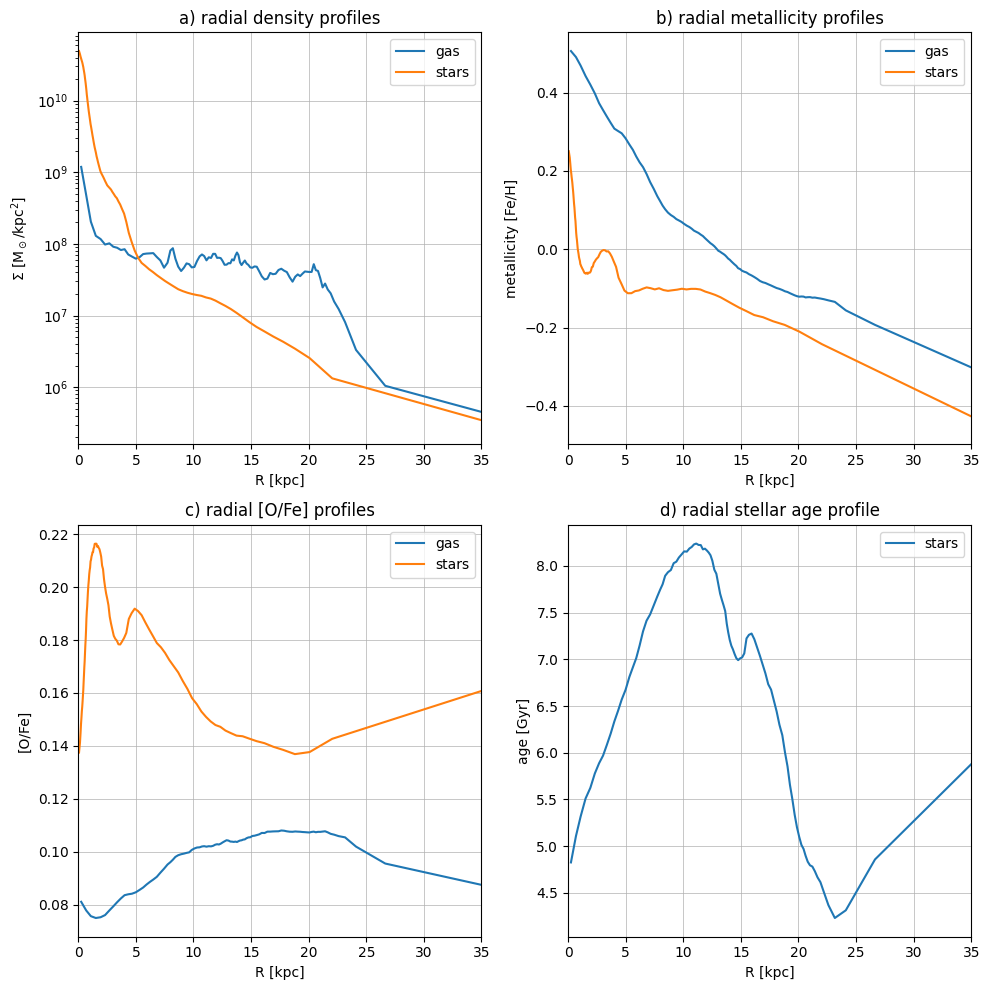

In [37]:
pg1 = pynbody.analysis.profile.Profile(gal.g, min = 0.01, max = 50, type = 'equaln')
ps1 = pynbody.analysis.profile.Profile(gal.s, min = 0.01, max = 50, type = 'equaln')

fig = plt.figure(figsize = (10,10))

ax1 = plt.subplot(221)
ax1.plot(pg1['rbins'],pg1['rho'], label = 'gas')
ax1.plot(ps1['rbins'],ps1['rho'], label = 'stars')
ax1.semilogy()
ax1.set_title('a) radial density profiles')
ax1.set_xlabel('R [kpc]')
ax1.set_ylabel('$\Sigma$ [M$_\odot$/kpc$^2$]')
ax1.legend()
ax1.grid(linewidth = 0.5)
ax1.set_xlim(0,35)

ax2 = plt.subplot(222)
ax2.plot(pg1['rbins'],pg1['feh'], label = 'gas')
ax2.plot(ps1['rbins'],ps1['feh'], label = 'stars')
ax2.set_title('b) radial metallicity profiles')
ax2.set_xlabel('R [kpc]')
ax2.set_ylabel('metallicity [Fe/H]')
ax2.legend()
ax2.grid(linewidth = 0.5)
ax2.set_xlim(0,35)

ax3 = plt.subplot(223)
ax3.plot(pg1['rbins'],pg1['ofe'], label = 'gas')
ax3.plot(ps1['rbins'],ps1['ofe'], label = 'stars')
ax3.set_title('c) radial [O/Fe] profiles')
ax3.set_xlabel('R [kpc]')
ax3.set_ylabel('[O/Fe]')
ax3.legend()
ax3.grid(linewidth = 0.5)
ax3.set_xlim(0,35)

ax4 = plt.subplot(224)
ax4.plot(pg1['rbins'],ps1['age'], label = 'stars')
ax4.set_title('d) radial stellar age profile')
ax4.set_xlabel('R [kpc]')
ax4.set_ylabel('age [Gyr]')
ax4.legend()
ax4.grid(linewidth = 0.5)
ax4.set_xlim(0,35)


fig.tight_layout()
plt.show()
fig.savefig('../Documents/Bachelorthesis/profiles_report.png')

/tmp/ipykernel_283/1768021418.py:8: RuntimeWarning: invalid value encountered in divide
  plt.scatter(bin[:-1], np.log10(hist/mass), color = 'darkblue', s = 10)
/tmp/ipykernel_283/1768021418.py:8: RuntimeWarning: invalid value encountered in log10
  plt.scatter(bin[:-1], np.log10(hist/mass), color = 'darkblue', s = 10)


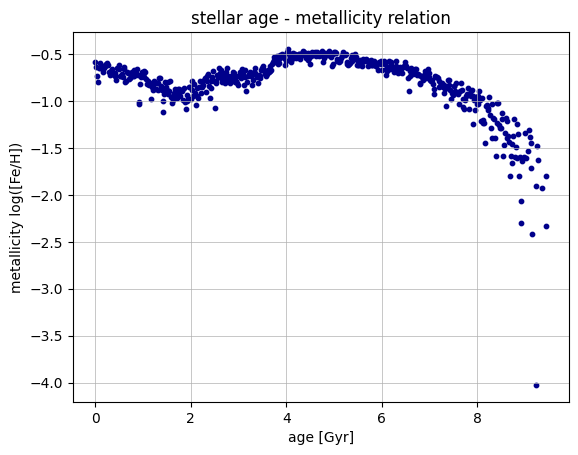

In [78]:
stat, edges, num = stats.binned_statistic(gal.s['age'], gal.s['feh']*gal.s['mass'], statistic = sum, bins = 50)
stat_mass, edges_mass, num_mass = stats.binned_statistic(gal.s['age'], gal.s['mass'], statistic = sum, bins = 50)

hist, bin = np.histogram(gal.s['age'],weights=gal.s['feh']*gal.s['mass'], bins=800)
mass, massbin = np.histogram(gal.s['age'],weights=gal.s['mass'], bins=800)

#plt.plot(edges[:-1], stat/stat_mass)
plt.scatter(bin[:-1], np.log10(hist/mass), color = 'darkblue', s = 10)
plt.title('stellar age - metallicity relation')
plt.xlabel('age [Gyr]')
plt.ylabel('metallicity log([Fe/H])')
plt.grid(linewidth = 0.5)
plt.savefig('../Documents/Bachelorthesis/age_metallicity_report.png')